In [1]:
import sys
import os
import numpy as np
sys.path.append('..')
from src import NeuralNet
from src import train as fit
from src import make_directory 
from models import load_model
from data import load_data
from six.moves import cPickle
from subprocess import call

np.random.seed(247) # for reproducibility

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib as mpl
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})
%matplotlib inline
from scipy.misc import imresize

from lasagne import layers, nonlinearities, updates, objectives, init 
from lasagne.layers import Conv2DLayer, TransposedConv2DLayer, DenseLayer, InputLayer, ExpressionLayer, BiasLayer

from lasagne.layers import get_output, get_output_shape, get_all_params
import theano.tensor as T
import theano
np.random.seed(247) # for reproducibility

Using gpu device 0: GeForce GTX 980 (CNMeM is disabled, cuDNN 4007)


In [187]:

name = 'DeepSea' # 'DeepSea'
datapath = '/media/peter/storage/'+name
options = {"class_range":0}
train, valid, test = load_data(name, datapath, options)
shape = (None, train[0].shape[1], train[0].shape[2], train[0].shape[3])
num_labels = np.round(train[1].shape[1])

H1-hESC dataset
loading training data
(199182, 4, 1000, 1)
loading validation data
(19230, 4, 1000, 1)
loading test data
(416, 4, 1000, 1)


In [188]:
# build model
model_name = "genome_motif_model"
nnmodel = NeuralNet(model_name, shape, num_labels)

In [189]:
#nnmodel.print_layers()
# set output file paths
filename = model_name + "_new"
datapath = make_directory(datapath, 'Results')
filepath = os.path.join(datapath, filename)

# train model
batch_size = 100
nnmodel = fit.train_minibatch(nnmodel, train, valid, batch_size=batch_size, num_epochs=500, 
            patience=10, verbose=1, filepath=filepath)


Epoch 1 out of 500 
[==============================] 100.0% -- time=0s -- loss=0.38171 -- accuracy=84.02%  
ROC
[ 0.92567246  0.82927457  0.79928884  0.7666216   0.90218809  0.71697937]
PR
[ 0.90431663  0.29721591  0.46639289  0.26755348  0.7763377   0.46266956]
  valid loss:		0.35604
  valid accuracy:	0.85438+/-0.06025
  valid auc-roc:	0.82334+/-0.07284
  valid auc-pr:		0.52908+/-0.23538
saving model parameters to: /media/peter/storage/DeepSea/Results/genome_motif_model_new_epoch_0.pickle
Epoch 2 out of 500 
[==============================] 100.0% -- time=0s -- loss=0.32229 -- accuracy=86.53%  
ROC
[ 0.94507741  0.85813366  0.82999742  0.89753947  0.91002621  0.82078421]
PR
[ 0.92669208  0.36411921  0.5373891   0.62184739  0.79107564  0.64341188]
  valid loss:		0.29381
  valid accuracy:	0.88009+/-0.04901
  valid auc-roc:	0.87693+/-0.04448
  valid auc-pr:		0.64742+/-0.17873
saving model parameters to: /media/peter/storage/DeepSea/Results/genome_motif_model_new_epoch_1.pickle
Epoch 3 ou

KeyboardInterrupt: 

In [190]:

# save best model --> lowest cross-validation error
min_loss, min_index = nnmodel.get_min_loss()
savepath = filepath + "_epoch_" + str(min_index) + ".pickle"
nnmodel.set_parameters_from_file(savepath)
savepath = filepath + "_best.pickle"
nnmodel.save_model_parameters(savepath)

# test model
nnmodel.test_model(test, batch_size, "test")

saving model parameters to: /media/peter/storage/DeepSea/Results/genome_motif_model_new_best.pickle
ROC
[ 0.96306591  0.95334295  0.94043667  0.89902604  0.96185773  0.91606418]
PR
[ 0.95490296  0.4361676   0.70517542  0.79088949  0.8862105   0.82235052]
  test loss:		0.19566
  test accuracy:	0.92083+/-0.03454
  test auc-roc:	0.93897+/-0.02392
  test auc-pr:		0.76595+/-0.16654


0.19566273654731825

In [191]:
net = nnmodel.network
net

{'conv1': <lasagne.layers.conv.Conv2DLayer at 0x7f05f9f61f10>,
 'conv1_active': <lasagne.layers.special.NonlinearityLayer at 0x7f05f9f61b90>,
 'conv1_dropout': <lasagne.layers.noise.DropoutLayer at 0x7f05f9f61b50>,
 'conv1_norm': <lasagne.layers.normalization.BatchNormLayer at 0x7f060ad1ee50>,
 'conv1_pool': <lasagne.layers.pool.MaxPool2DLayer at 0x7f05f9f61210>,
 'conv2': <lasagne.layers.conv.Conv2DLayer at 0x7f05f9f61490>,
 'conv2_active': <lasagne.layers.special.NonlinearityLayer at 0x7f05f94a9710>,
 'conv2_dropout': <lasagne.layers.noise.DropoutLayer at 0x7f05f94a9dd0>,
 'conv2_norm': <lasagne.layers.normalization.BatchNormLayer at 0x7f05f9f61410>,
 'conv2_pool': <lasagne.layers.pool.MaxPool2DLayer at 0x7f05f94a9250>,
 'conv3': <lasagne.layers.conv.Conv2DLayer at 0x7f05f94a90d0>,
 'conv3_active': <lasagne.layers.special.NonlinearityLayer at 0x7f05f94a99d0>,
 'conv3_dropout': <lasagne.layers.noise.DropoutLayer at 0x7f05f94a9bd0>,
 'conv3_norm': <lasagne.layers.normalization.BatchNor

In [192]:

def height_logo(X, I, height=100, nt_width=20, norm=0, rna=0, filepath='.'):
    """generate a sequence logo from a pwm"""
    
    def load_alphabet(filepath, rna):
        """load images of nucleotide alphabet """
        df = pd.read_table(os.path.join(filepath, 'A.txt'), header=None);
        A_img = df.as_matrix()
        A_img = np.reshape(A_img, [72, 65, 3], order="F").astype(np.uint8)

        df = pd.read_table(os.path.join(filepath, 'C.txt'), header=None);
        C_img = df.as_matrix()
        C_img = np.reshape(C_img, [76, 64, 3], order="F").astype(np.uint8)

        df = pd.read_table(os.path.join(filepath, 'G.txt'), header=None);
        G_img = df.as_matrix()
        G_img = np.reshape(G_img, [76, 67, 3], order="F").astype(np.uint8)

        if rna == 1:
            df = pd.read_table(os.path.join(filepath, 'U.txt'), header=None);
            T_img = df.as_matrix()
            T_img = np.reshape(T_img, [74, 57, 3], order="F").astype(np.uint8)
        else:
            df = pd.read_table(os.path.join(filepath, 'T.txt'), header=None);
            T_img = df.as_matrix()
            T_img = np.reshape(T_img, [72, 59, 3], order="F").astype(np.uint8)

        return A_img, C_img, G_img, T_img


    
    # get the alphabet images of each nucleotide
    A_img, C_img, G_img, T_img = load_alphabet(filepath='.', rna=1)
    
    
    # resize nucleotide images for each base of sequence and stack
    num_seq = X.shape[2]
    width = np.ceil(nt_width*num_seq).astype(int)    
    logo = np.ones((height, width, 3)).astype(int)*255;
    nt_height = np.round(height*I).astype(int)

    for i in range(num_seq):
        index = np.argmax(X[0,:,i,0])

        # resized dimensions of image
        if nt_height[i] > 0:
            resize = (nt_height[i], nt_width)
            if index == 0:
                nt_img = imresize(A_img, resize)
            elif index == 1:
                nt_img = imresize(C_img, resize)
            elif index == 2:
                nt_img = imresize(G_img, resize)
            elif index == 3:
                nt_img = imresize(T_img, resize)

            # determine location of image
            height_range = range(height-nt_height[i],height)
            width_range = range(i*nt_width, i*nt_width+nt_width)

            # 'annoying' way to broadcast resized nucleotide image
            if height_range:
                for k in range(3):
                    for m in range(len(width_range)):
                        logo[height_range, width_range[m],k] = nt_img[:,m,k];

    return logo.astype(np.uint8)

In [193]:
import pandas as pd
def seq_logo(pwm, height=100, nt_width=20, norm=0, rna=0, filepath='.'):
    """generate a sequence logo from a pwm"""
    
    def load_alphabet(filepath, rna):
        """load images of nucleotide alphabet """
        df = pd.read_table(os.path.join(filepath, 'A.txt'), header=None);
        A_img = df.as_matrix()
        A_img = np.reshape(A_img, [72, 65, 3], order="F").astype(np.uint8)

        df = pd.read_table(os.path.join(filepath, 'C.txt'), header=None);
        C_img = df.as_matrix()
        C_img = np.reshape(C_img, [76, 64, 3], order="F").astype(np.uint8)

        df = pd.read_table(os.path.join(filepath, 'G.txt'), header=None);
        G_img = df.as_matrix()
        G_img = np.reshape(G_img, [76, 67, 3], order="F").astype(np.uint8)

        df = pd.read_table(os.path.join(filepath, 'T.txt'), header=None);
        T_img = df.as_matrix()
        T_img = np.reshape(T_img, [72, 59, 3], order="F").astype(np.uint8)

        return A_img, C_img, G_img, T_img


    def get_nt_height(pwm, height, norm):
        """get the heights of each nucleotide"""

        def entropy(p):
            """calculate entropy of each nucleotide"""
            s = 0
            for i in range(4):
                if p[i] > 0:
                    s -= p[i]*np.log2(p[i])
            return s

        num_nt, num_seq = pwm.shape
        heights = np.zeros((num_nt,num_seq));
        for i in range(num_seq):
            if norm == 1:
                total_height = height
            else:
                total_height = (np.log2(4) - entropy(pwm[:, i]))*height;
            heights[:,i] = np.floor(pwm[:,i]*total_height);
        return heights.astype(int)

    
    # get the alphabet images of each nucleotide
    A_img, G_img, C_img, T_img = load_alphabet(filepath='.', rna=1)
    
    
    # get the heights of each nucleotide
    heights = get_nt_height(pwm, height, norm)
    
    # resize nucleotide images for each base of sequence and stack
    num_nt, num_seq = pwm.shape
    width = np.ceil(nt_width*num_seq).astype(int)
    
    total_height = np.sum(heights,axis=0)
    max_height = np.max(total_height)
    logo = np.ones((height*2, width, 3)).astype(int)*255;
    for i in range(num_seq):
        remaining_height = total_height[i];
        offset = max_height-remaining_height
        nt_height = np.sort(heights[:,i]);
        index = np.argsort(heights[:,i])

        for j in range(num_nt):
            if nt_height[j] > 0:
                # resized dimensions of image
                resize = (nt_height[j], nt_width)
                if index[j] == 0:
                    nt_img = imresize(A_img, resize)
                elif index[j] == 1:
                    nt_img = imresize(C_img, resize)
                elif index[j] == 2:
                    nt_img = imresize(G_img, resize)
                elif index[j] == 3:
                    nt_img = imresize(T_img, resize)

                # determine location of image
                height_range = range(remaining_height-nt_height[j], remaining_height)
                width_range = range(i*nt_width, i*nt_width+nt_width)

                # 'annoying' way to broadcast resized nucleotide image
                if height_range:
                    for k in range(3):
                        for m in range(len(width_range)):
                            logo[height_range+offset, width_range[m],k] = nt_img[:,m,k];

                remaining_height -= nt_height[j]

    return logo.astype(np.uint8)


In [194]:
def maxunpool(X, pool, active):
    pool_size = active.shape[2]/pool.shape[2]
    fmap1 = []
    for k in range(active.shape[0]):
        x = np.squeeze(active[k],axis=(2,))
        mymap = np.squeeze(pool[k],axis=(2,))

        max_index = []
        for i in range(x.shape[1]/pool_size):
            index = range(i*pool_size,(i+1)*pool_size)
            max_index.append(np.argmax(x[:,index],axis=1))
        max_index = np.array(max_index)
        max_index

        dim,seq_length = mymap.shape
        fmap_unpool = np.zeros((dim,seq_length*pool_size))
        for i in range(x.shape[1]/pool_size):
            index = range(i*pool_size,(i+1)*pool_size)
            for j in range(dim):
                fmap_unpool[j,index[max_index[i][j]]] = mymap[j,i]
        fmap1.append(fmap_unpool)

    fmap1 = np.array(fmap1)
    fmap1 = np.expand_dims(fmap1, 3)
    return fmap1 

def deconvolution(fmap, layer):
    # psuedo-inverse filters
    W4 = layer.W.get_value()

    # deconvolution layer 2
    input_var4 = T.tensor4('conv4')
    shape4 = list(fmap.shape)
    shape4[0] = None
    input4 = InputLayer(shape=tuple(shape4), input_var=input_var4)
    #unpool4 = ExpressionLayer(input4, lambda X: T.log(T.exp(X)-1 + 1e-7), output_shape='auto')
    #unpool4 = BiasLayer(unpool4, b=-network['conv2_bias'].b)
    if layer.pad == 'valid':
        pad = 'full'
    else:
        pad = 'same'
    deconv4 = Conv2DLayer(input4, num_filters=layer.input_shape[1],
                                          filter_size=layer.filter_size,
                                          W=layer.W.dimshuffle([1,0,2,3]), #W2_inv, #
                                          b=None, 
                                          pad= 'full' if layer.pad==(0,0) else 'same',
                                          nonlinearity=None, flip_filters=False)
    predict = theano.function([input_var4], get_output(deconv4, deterministic=True), allow_input_downcast=True)

    intermediate = predict(fmap.astype(np.float32))
    return np.array(intermediate)

def get_feature_map_all(layer, input_var, X):
    get_map = theano.function([input_var], get_output(layer), allow_input_downcast=True)
    return get_map(X)

def ImportanceDeconvolution(X, network):

    seq_length = X.shape[2]

    # get dense layer
    get_conv5 = theano.function([nnmodel.input_var], layers.get_output(network['conv5'], deterministic=True), allow_input_downcast=True)
    conv5 = get_conv5(X)
    #MAX = np.max(conv4)
    #conv4 = conv4/MAX
    #conv4 = np.exp(conv4)
    #conv4 = conv4/np.max(conv4)
    conv5[conv5<0.0] = 0
    conv4 = deconvolution(conv5, network['conv5'])
    conv4[conv4<0.0] = 0


    conv3 = deconvolution(conv4, network['conv4'])
    #MAX = np.max(conv3)
    #conv3 = conv3/MAX
    #conv3 = np.exp(conv3)
    #conv3 =conv3/np.max(conv3)
    #conv3[conv3<0.05] = 0
    conv3[conv3<0.0] = 0

    conv2_pool = deconvolution(conv3, network['conv3'])
    conv2_active = get_feature_map_all(network['conv2'], nnmodel.input_var, X)
    conv2 = maxunpool(X, conv2_pool, conv2_active)
    #MAX = np.max(conv2)
    #conv2 = conv2/MAX
    #conv2 = np.exp(conv2)
    #conv2 =conv2/np.max(conv2)
    #conv2[conv2<0.05] = 0
    conv2[conv2<0.0] = 0

    conv1_pool = deconvolution(conv2, network['conv2'])
    pool = np.squeeze(conv1_pool[0])
    #MAX = np.max(conv1_pool)
    #conv1_pool = conv1_pool/MAX
    #conv1_pool = np.exp(conv1_pool)
    #conv1_pool = conv1_pool/np.max(conv1_pool)
    #conv1_pool[conv1_pool<0.1] = 0
    conv1_pool[conv1_pool<0.0] = 0
    
    conv1_active = get_feature_map_all(network['conv1'], nnmodel.input_var, X)
    conv1 = maxunpool(X, conv1_pool, conv1_active)
    reconstruction = deconvolution(conv1, network['conv1'])

    pwm = np.squeeze(reconstruction[0])

    return pwm

In [195]:
import theano
import theano.tensor as T
import lasagne
def compile_saliency_function(net):
    """
    Compiles a function to compute the saliency maps and predicted classes
    for a given minibatch of input images.
    """
    inp = net['input'].input_var
    outp = lasagne.layers.get_output(net['conv5_active'], deterministic=True)
    max_outp = T.max(outp, axis=1)
    saliency = theano.grad(max_outp.sum(), wrt=inp)
    max_class = T.argmax(outp, axis=1)
    return theano.function([inp], [saliency, max_class])

In [196]:
train_fn = compile_saliency_function(net)

In [197]:
class ModifiedBackprop(object):

    def __init__(self, nonlinearity):
        self.nonlinearity = nonlinearity
        self.ops = {}  # memoizes an OpFromGraph instance per tensor type

    def __call__(self, x):
       
        cuda_var = theano.sandbox.cuda.as_cuda_ndarray_variable
        x = cuda_var(x)
        tensor_type = x.type
        
        if tensor_type not in self.ops:
            input_var = tensor_type()
            output_var = cuda_var(self.nonlinearity(input_var))
            op = theano.OpFromGraph([input_var], [output_var])
            op.grad = self.grad
            self.ops[tensor_type] = op

        return self.ops[tensor_type](x)
    
class GuidedBackprop(ModifiedBackprop):
    def grad(self, inputs, out_grads):
        (inp,) = inputs
        (grd,) = out_grads
        dtype = inp.dtype
        return (grd * (inp > 0).astype(dtype) * (grd > 0).astype(dtype),)



In [198]:
relu = nonlinearities.rectify
modified_relu = GuidedBackprop(relu)  # important: only instantiate this once!

relu_layers = [layer for layer in layers.get_all_layers(net['output'])
               if getattr(layer, 'nonlinearity', None) is relu]
for layer in relu_layers:
    layer.nonlinearity = modified_relu


In [199]:
saliency_fn = compile_saliency_function(net)

prediction = 2
prediction = 4


(-0.5, 5999.5, 199.5, -0.5)

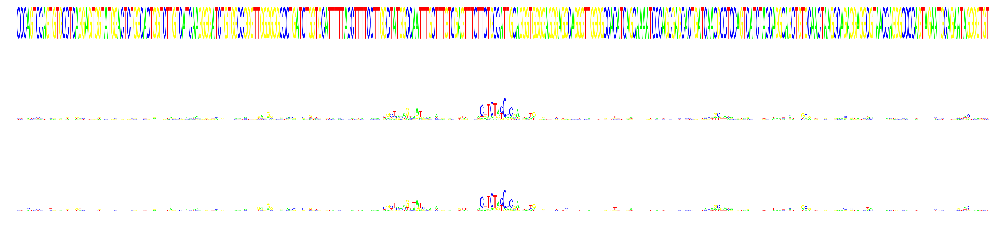

In [200]:
map_index = 7

X = test[0][map_index]
X = np.expand_dims(X,0).astype(np.float32)
y = test[1][map_index].astype(np.float32)

# get prediction
get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = get_prediction(X)
print 'prediction = ' + str(np.argmax(prediction))
print 'prediction = ' + str(np.argmax(y))


def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm


grad = train_fn(X)
saliency, max_class = saliency_fn(X)

height=100
bp_width=20
size = (25.,10.0)


pwm = np.copy(np.squeeze(grad[0]))
pwm=normalize_pwm2(pwm)
index = np.argmax(np.std(pwm,axis=0))
index = range(index-150,index+150)


logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
fig = plt.figure(figsize=size);

plt.subplot(4,1,1)
plt.imshow(logo, interpolation='none');
plt.axis('off');


pwm = np.copy(np.squeeze(grad[0]))
pwm=normalize_pwm2(pwm)
index = np.argmax(np.std(pwm,axis=0))
index = range(index-150,index+150)
pwm = pwm[:,index]

plt.subplot(4,1,2)
logo = seq_logo(pwm, height, bp_width, norm=0, rna=0, filepath='.')
plt.imshow(logo, interpolation='none');
plt.axis('off');

pwm2 = np.copy(np.squeeze(saliency[0]))
pwm2=normalize_pwm2(pwm2)
index = np.argmax(np.std(pwm2,axis=0))
index = range(index-150,index+150)
pwm2 = pwm2[:,index]

plt.subplot(4,1,3)
logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
plt.imshow(logo, interpolation='none');
plt.axis('off');


#pwm3=ImportanceDeconvolution(X,net)
#pwm3=normalize_pwm2(pwm3)

#plt.subplot(4,1,4)
#logo = seq_logo(pwm3, height, bp_width, norm=0, rna=0, filepath='.')
#plt.imshow(logo, interpolation='none');
#plt.axis('off');




In [171]:
# CTCF  GABP SP1  SRF  TAF1 YY1 

# CTCF for various cell types

# K562

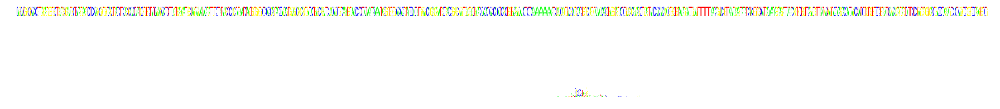

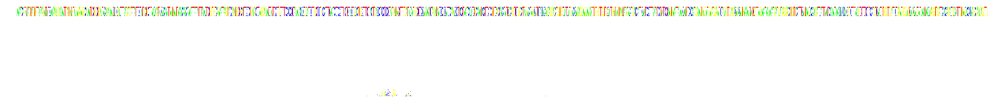

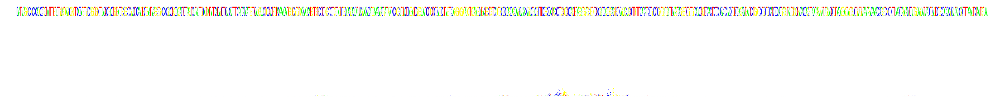

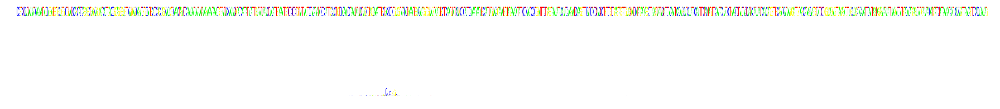

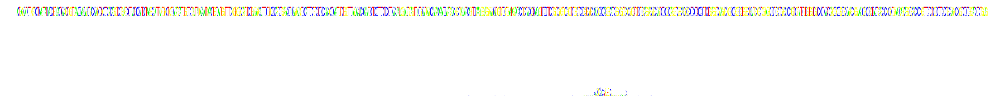

...

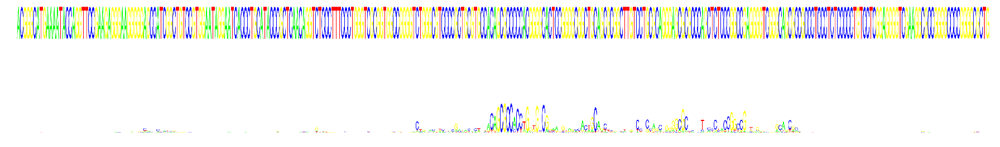

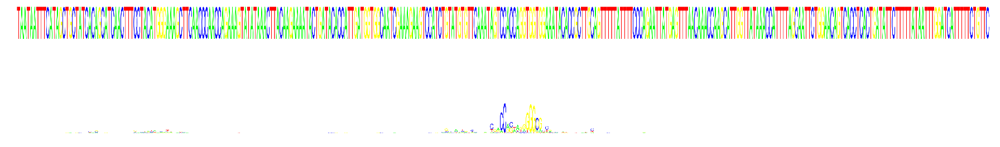

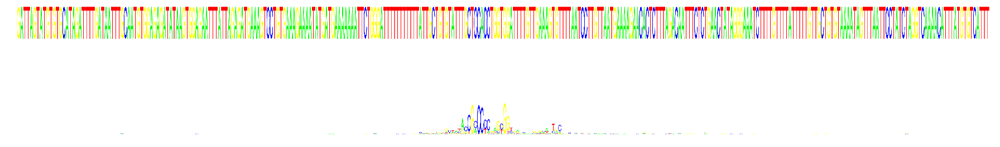

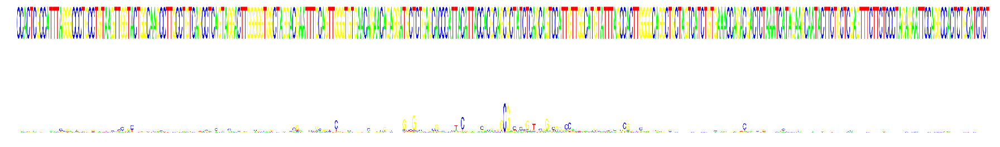

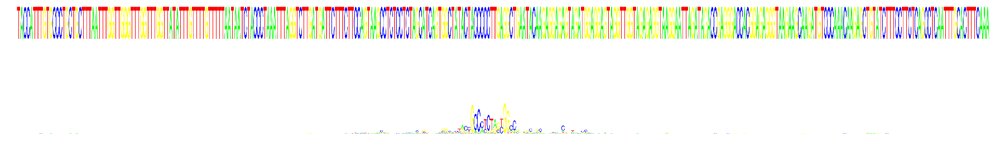

In [184]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 0)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]


unique_index = np.where((valid[1][:,0]==1) & (np.sum(valid[1],axis=1)==1))[0]
class_index = unique_index[(np.where(predicted_class[unique_index]==2))[0]]
class_index = class_index[np.argsort(predicted_class[class_index])]


height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


# H1-hESC

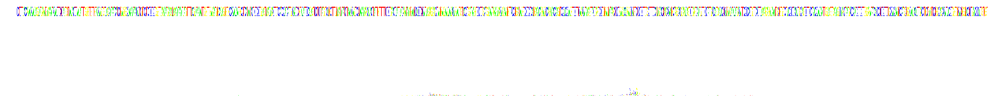

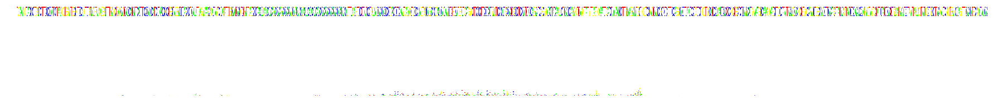

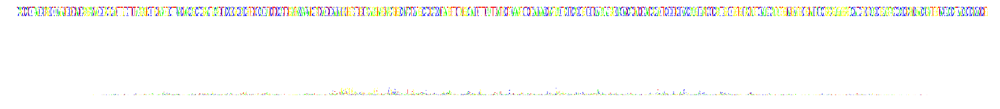

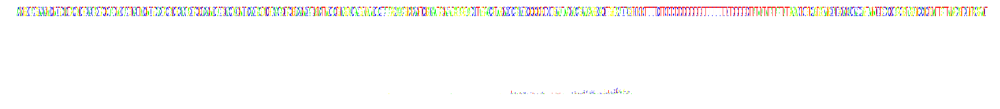

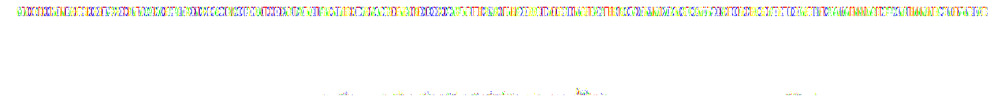

...

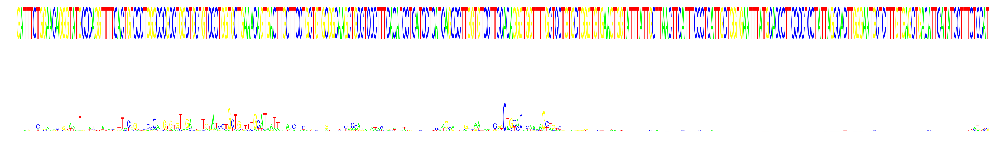

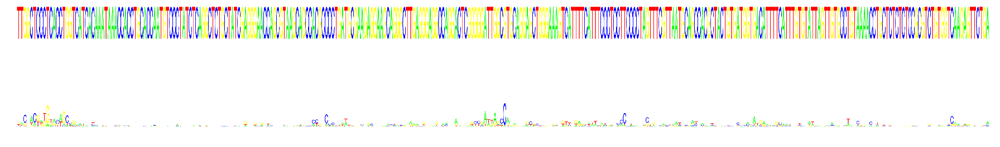

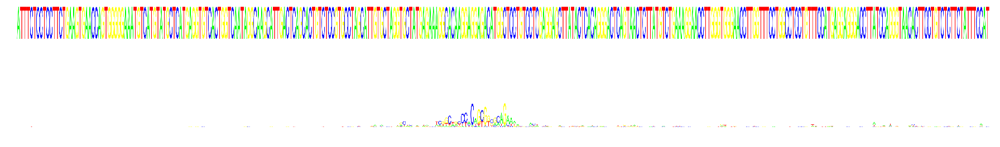

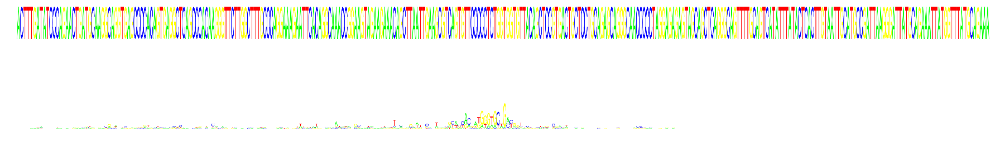

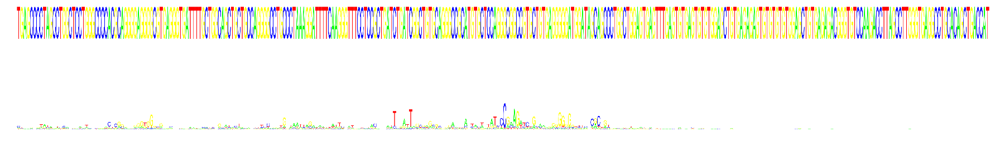

In [201]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 1)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]
unique_index = np.where((valid[1][:,1]==1) & (np.sum(valid[1],axis=1)==1))[0]
class_index = unique_index[(np.where(predicted_class[unique_index]==2))[0]]
class_index = class_index[np.argsort(predicted_class[class_index])]



height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    


# HepG2

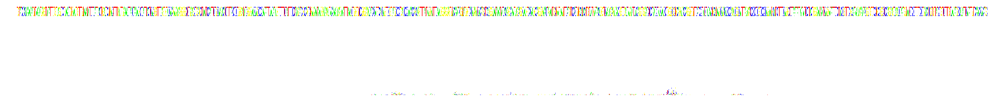

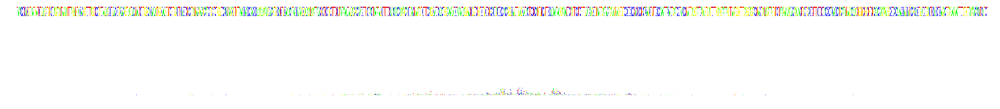

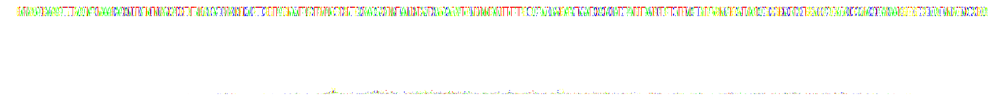

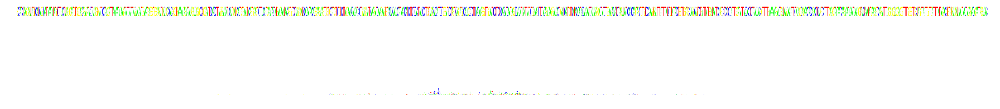

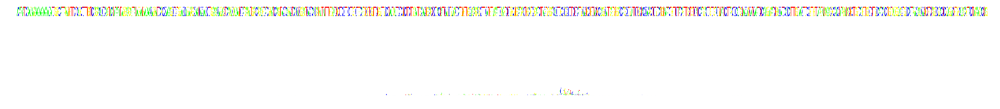

...

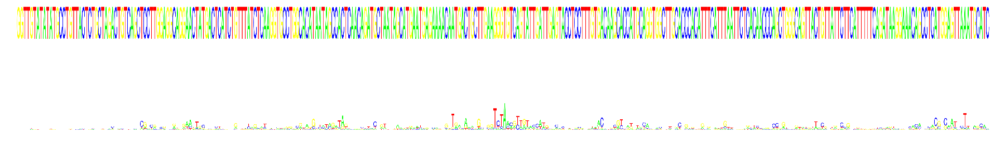

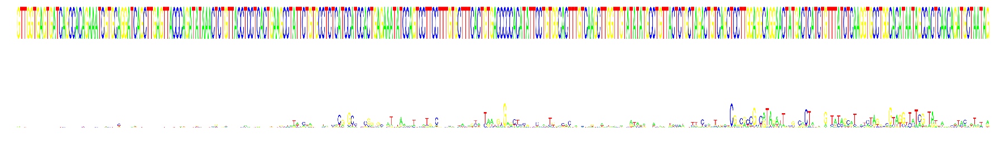

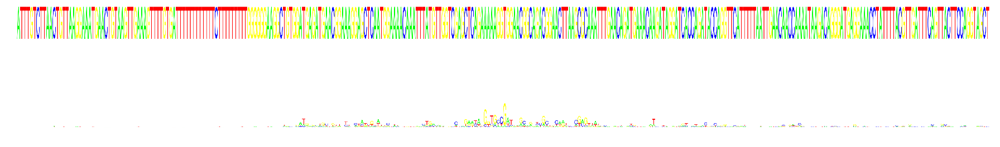

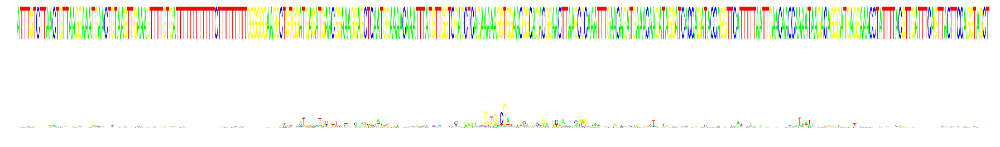

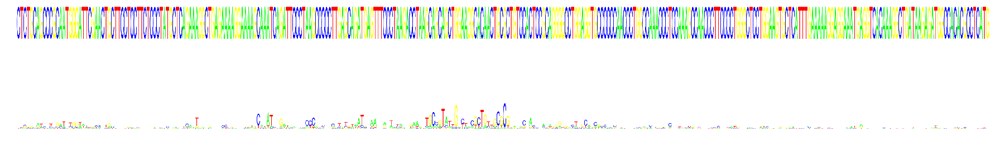

In [202]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 2)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]

unique_index = np.where((valid[1][:,2]==1) & (np.sum(valid[1],axis=1)==1))[0]
class_index = unique_index[(np.where(predicted_class[unique_index]==2))[0]]
class_index = class_index[np.argsort(predicted_class[class_index])]



height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


In [203]:
prediction

array([[  9.59915340e-01,   1.92527965e-01,   3.84396203e-02,
          3.42202224e-02,   1.21077396e-01,   5.47158420e-01],
       [  1.68419187e-03,   3.59317511e-02,   4.68009144e-01,
          3.58922854e-02,   8.06916356e-01,   4.02973741e-02],
       [  2.70864189e-01,   3.09988141e-01,   2.40823194e-01,
          8.44558999e-02,   7.67663062e-01,   8.72257426e-02],
       ..., 
       [  6.72997177e-01,   7.11080730e-02,   1.94392428e-01,
          2.15733126e-02,   1.51504204e-01,   1.23515360e-01],
       [  9.83250678e-01,   1.60449855e-02,   5.42721618e-03,
          2.70902063e-03,   7.68451532e-03,   4.22155768e-01],
       [  9.79499400e-01,   6.75245840e-03,   3.83119658e-02,
          2.46468699e-04,   5.49456896e-03,   9.98444762e-03]], dtype=float32)

# H1-hESC cell-type


# CTCF

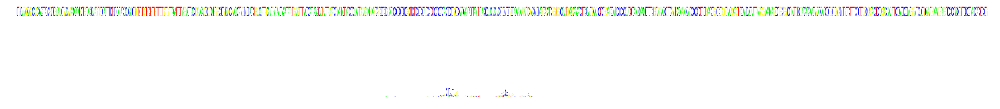

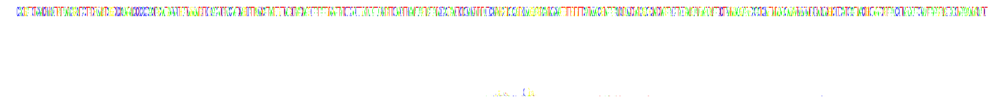

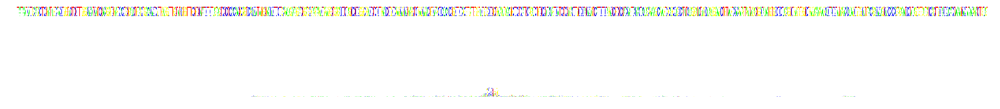

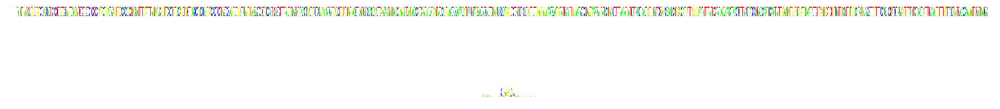

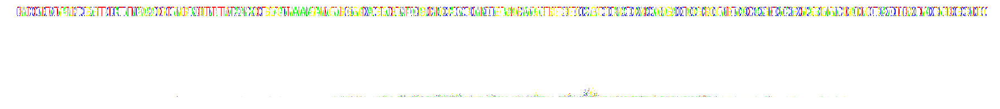

...

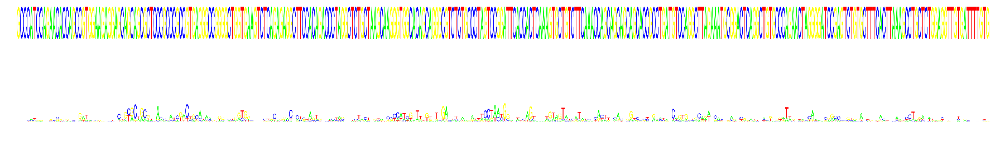

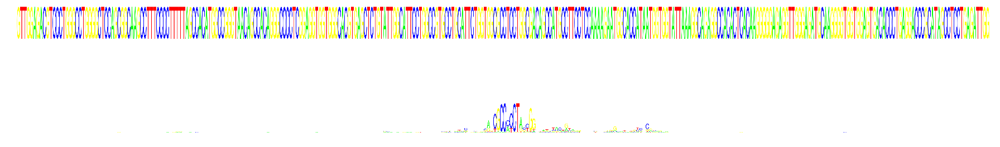

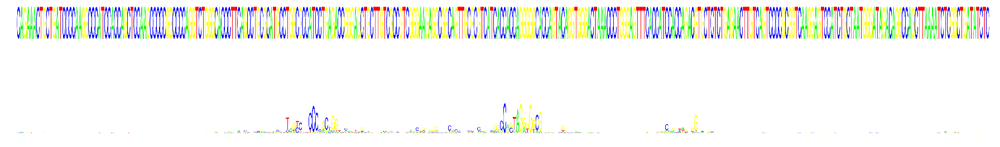

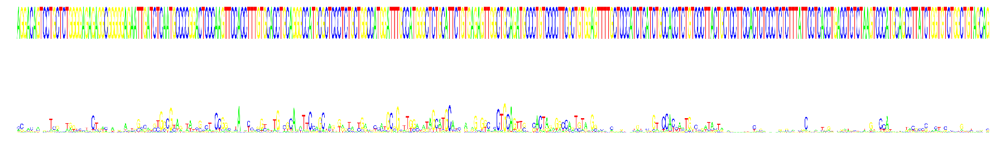

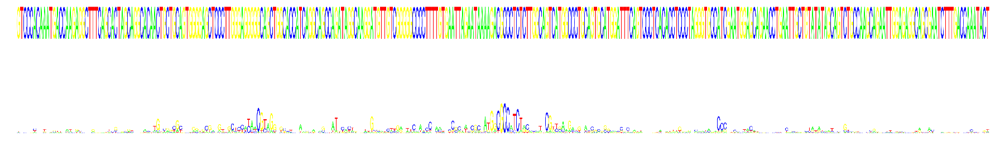

In [204]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(test[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 0)[0]
ground_truth = np.argmax(test[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]


height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = test[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[10:20]:
    X = test[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


# SRF

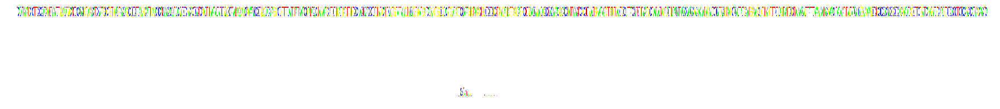

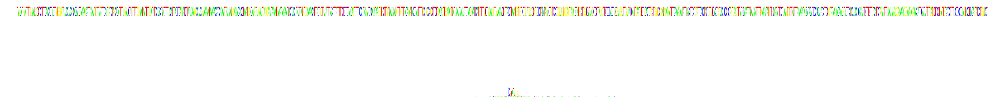

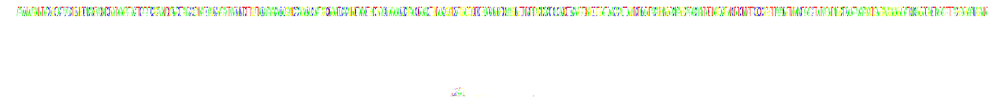

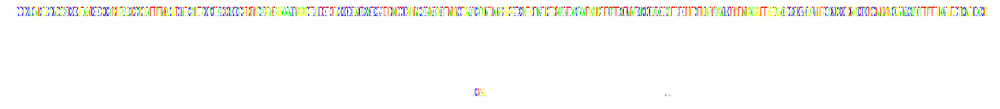

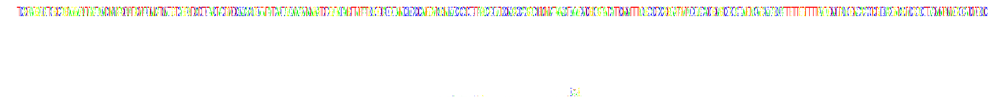

...

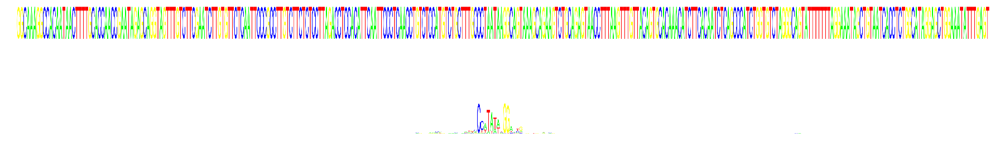

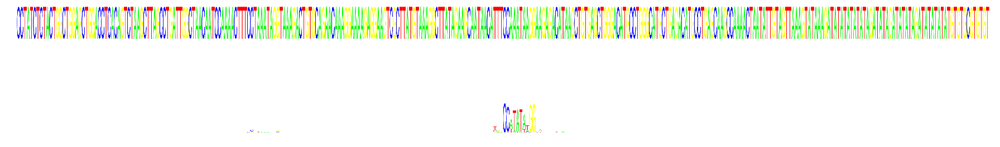

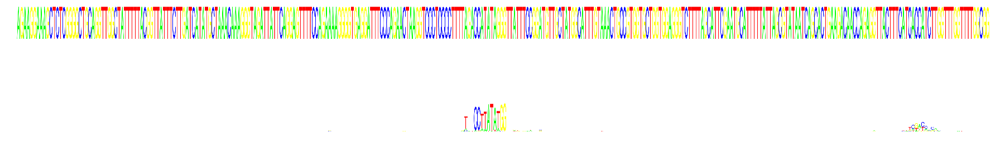

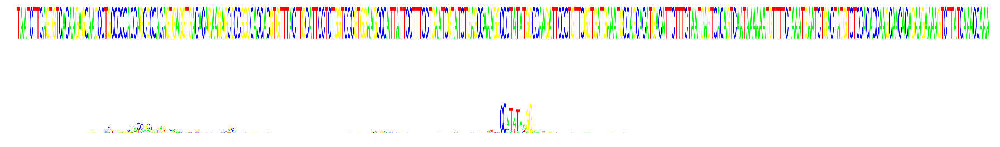

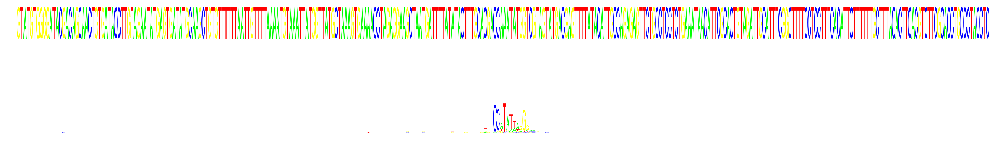

In [205]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 3)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]

height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    


# SP1

In [206]:
len(class_index)

402

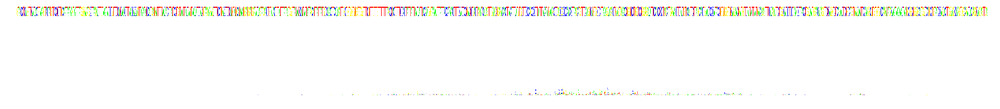

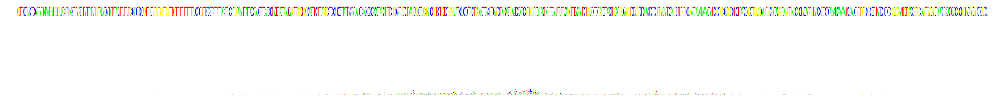

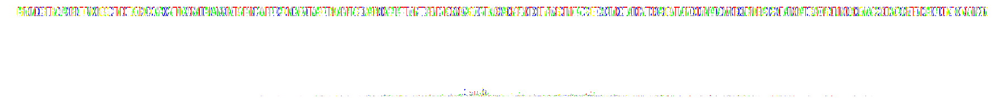

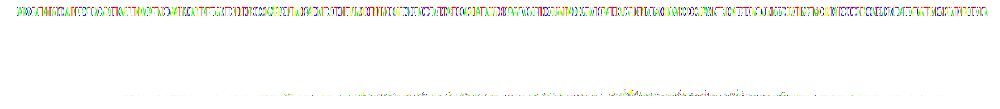

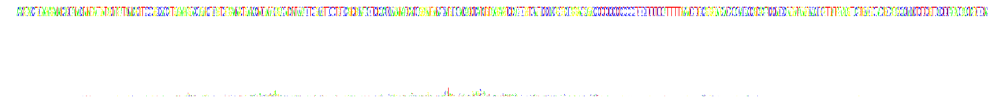

...

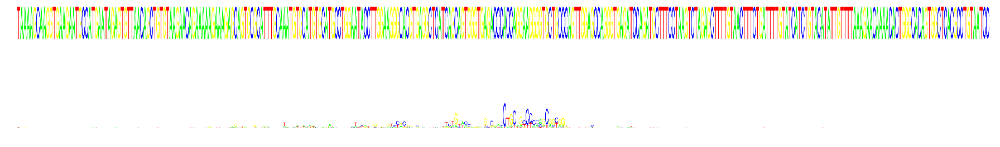

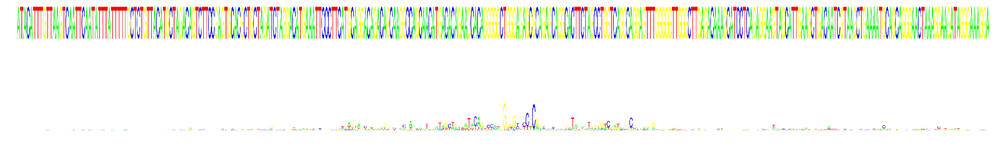

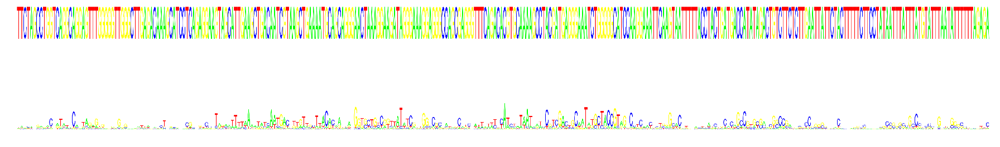

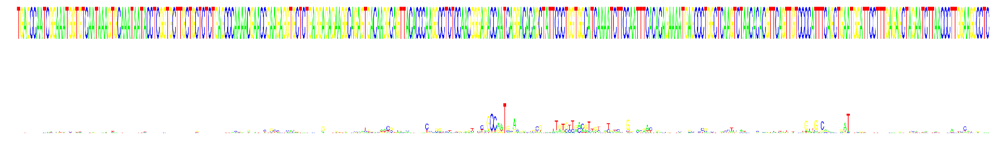

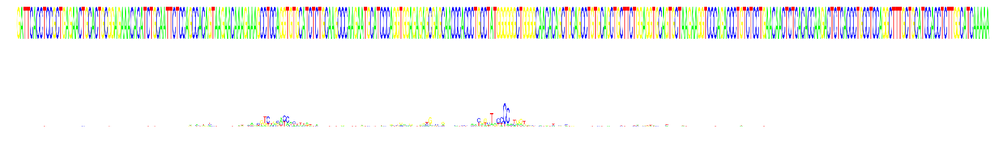

In [207]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

#class_index = np.where(predicted_class == 2)[0]
#ground_truth = np.argmax(valid[1],axis=1)
#index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
#class_index = class_index[index]

unique_index = np.where((valid[1][:,2]==1) & (np.sum(valid[1],axis=1)==1))[0]
class_index = unique_index[np.where(predicted_class[unique_index]==2)[0]]

height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[100:110]:
    
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)
    
    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[100:110]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');
    

# YY1

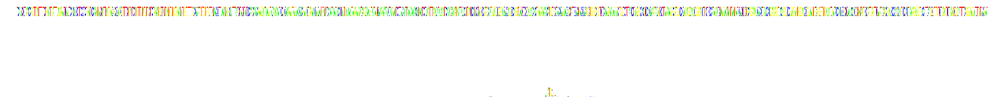

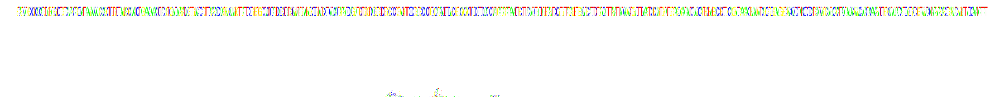

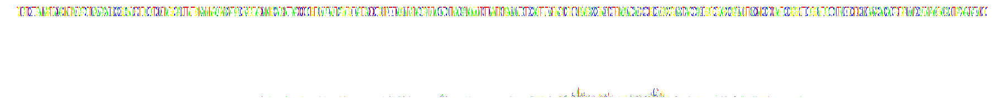

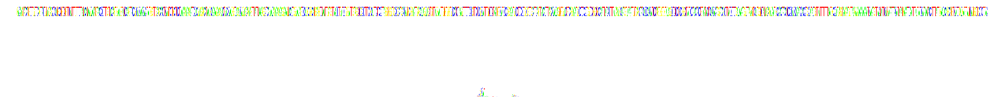

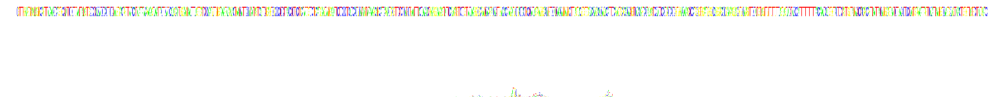

...

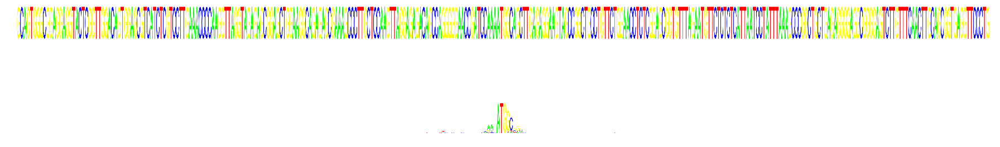

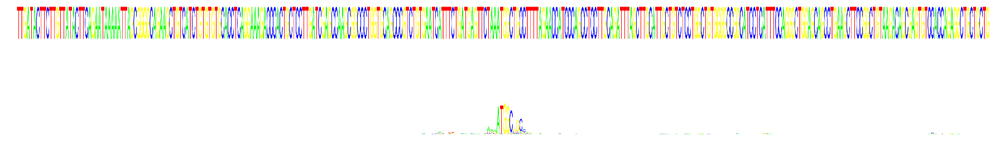

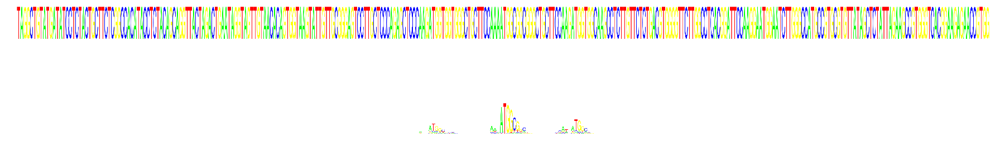

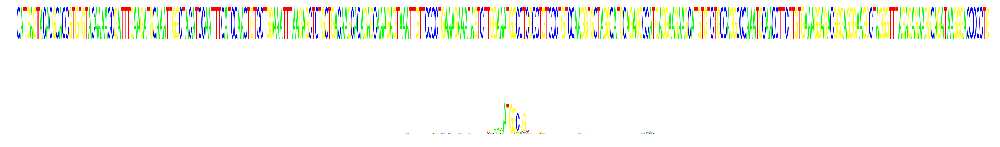

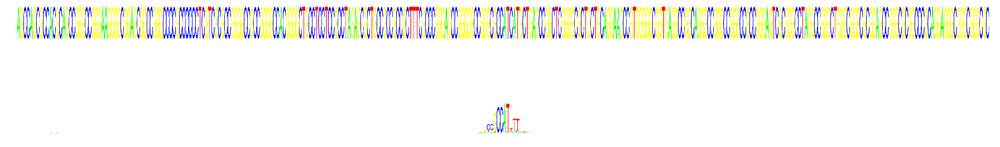

In [208]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 5)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]


height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[30:40]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


# GABP

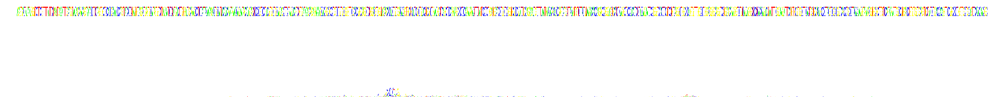

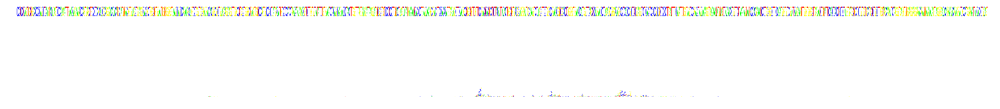

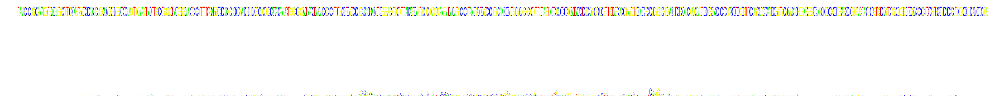

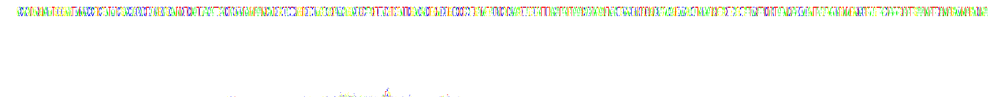

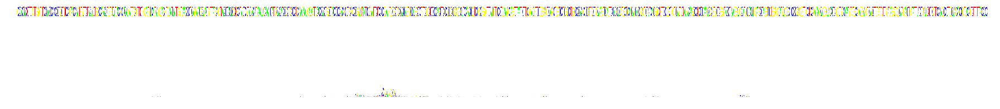

...

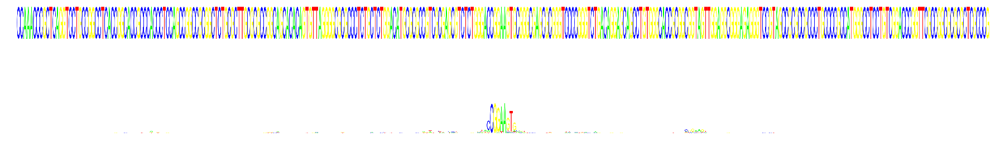

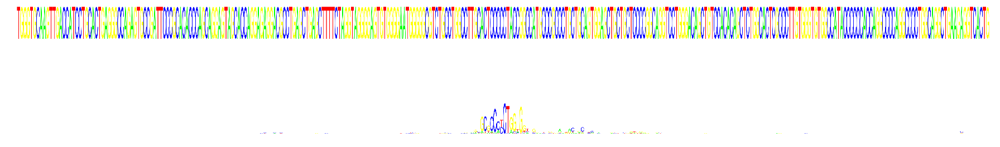

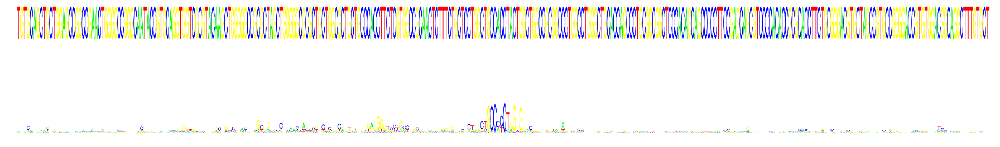

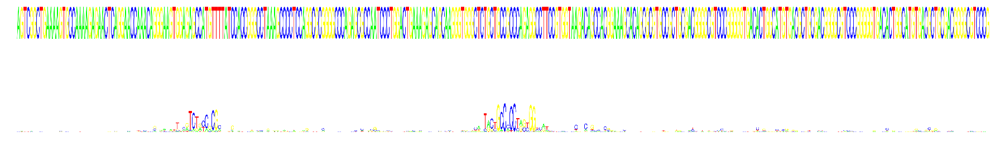

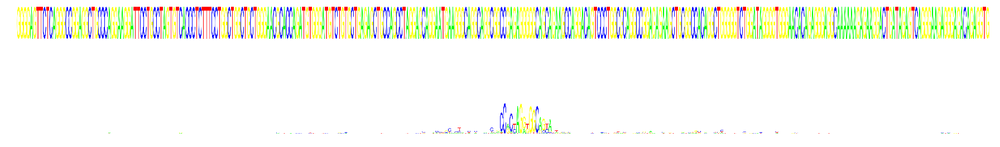

In [209]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 1)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]


height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[30:40]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


# TAF1

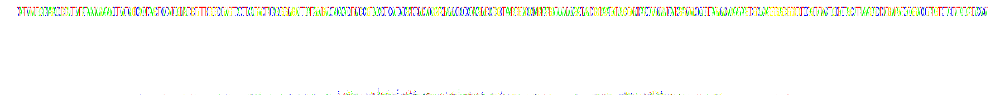

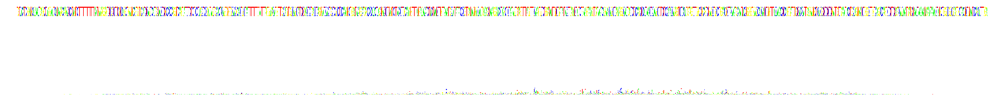

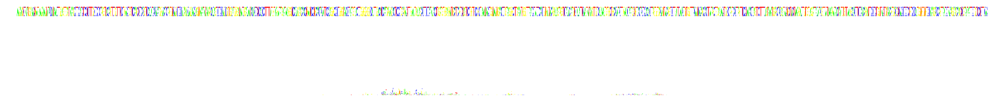

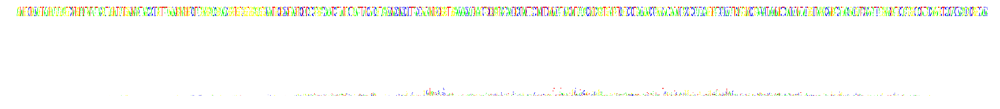

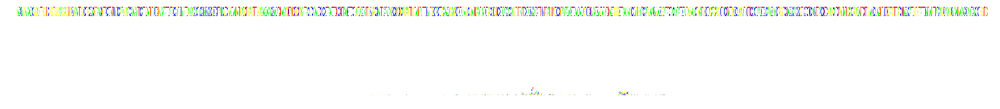

...

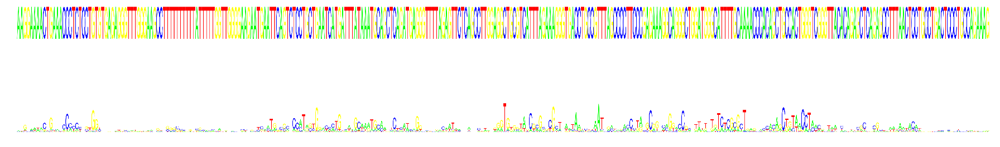

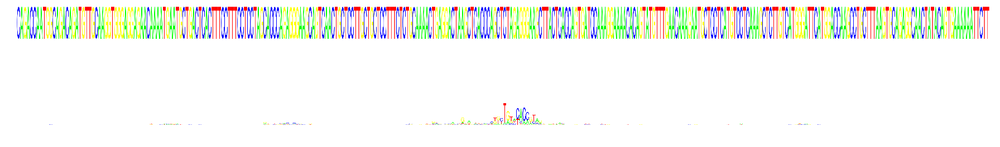

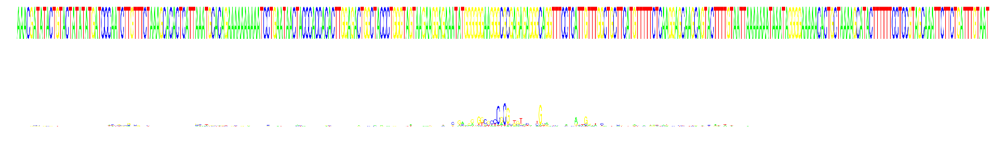

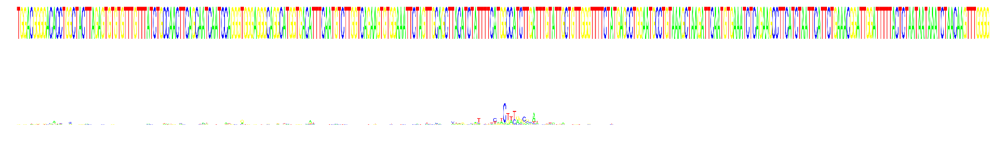

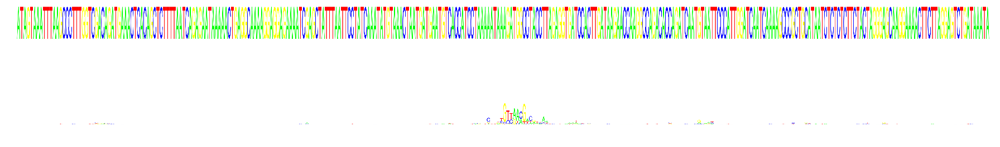

In [210]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)
unique_index = np.where((valid[1][:,4]==1) & (np.sum(valid[1],axis=1)==1))[0]
class_index = unique_index[np.where(predicted_class[unique_index]==2)[0]]

height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[0:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-30,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[10:20]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


# HepG2 cell-type


# CTCF

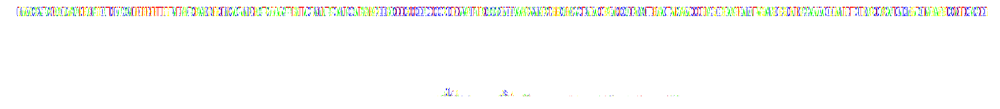

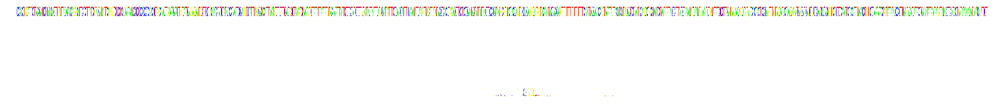

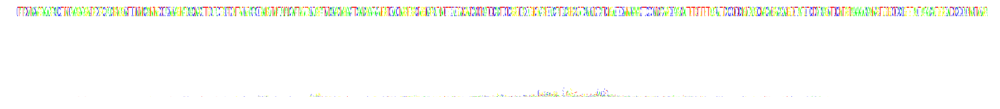

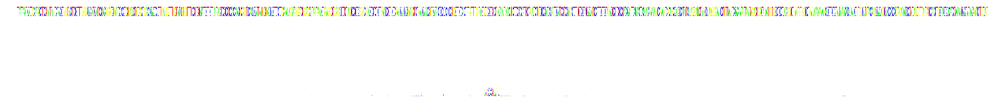

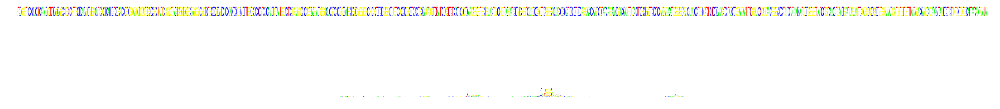

...

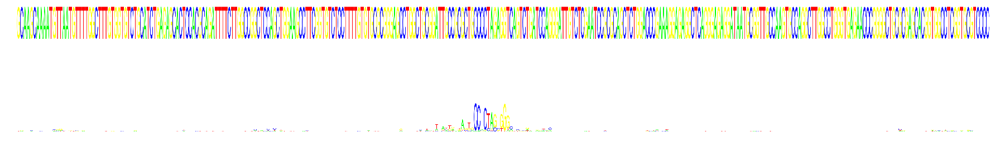

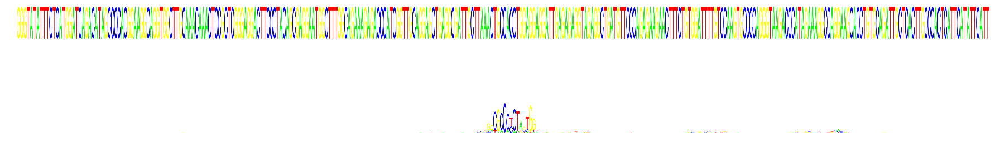

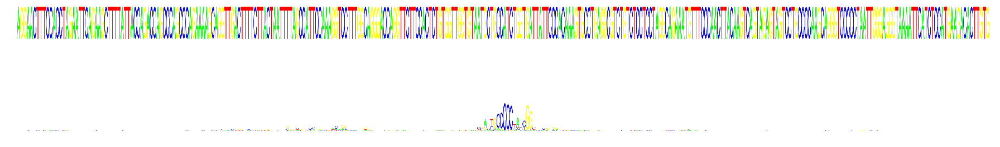

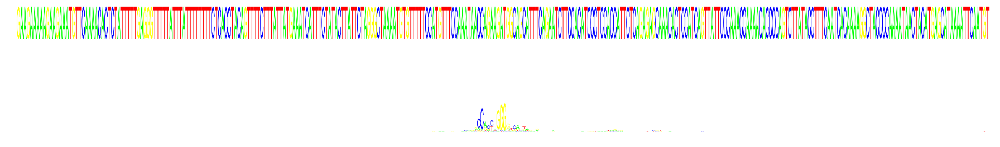

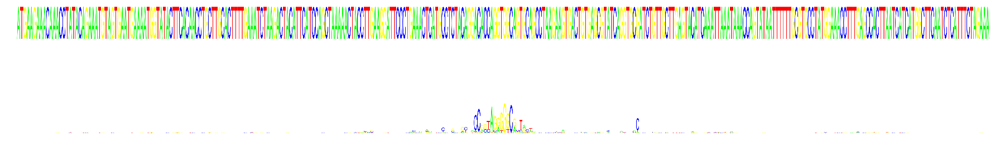

In [120]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(test[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 0)[0]
ground_truth = np.argmax(test[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]


height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = test[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[10:20]:
    X = test[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


# SRF

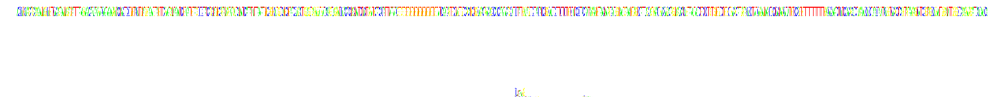

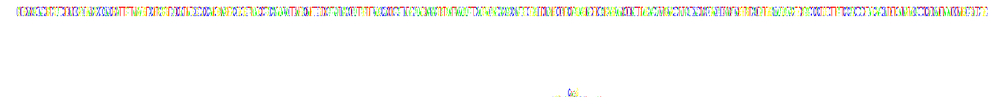

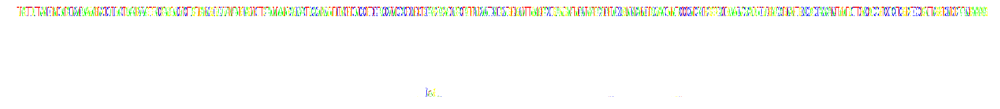

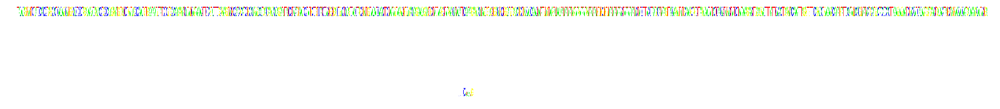

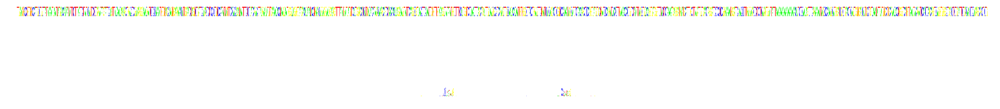

...

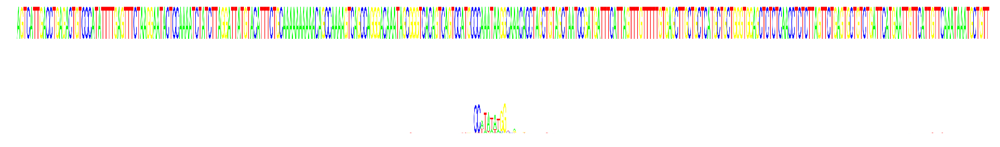

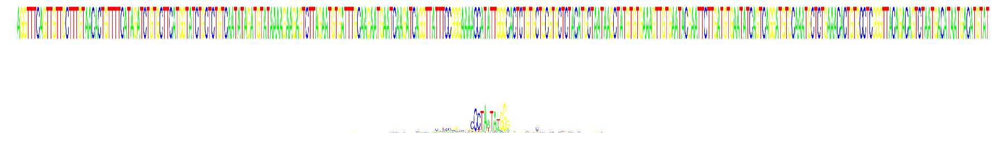

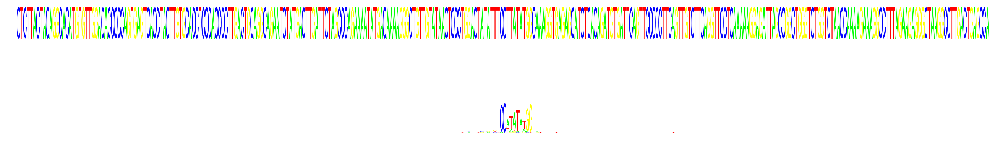

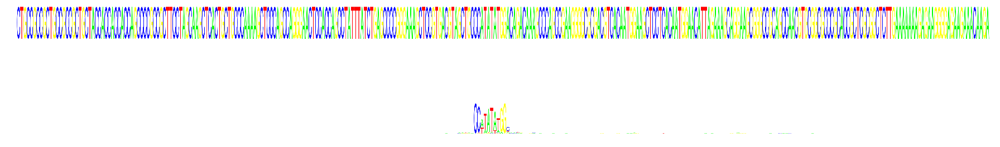

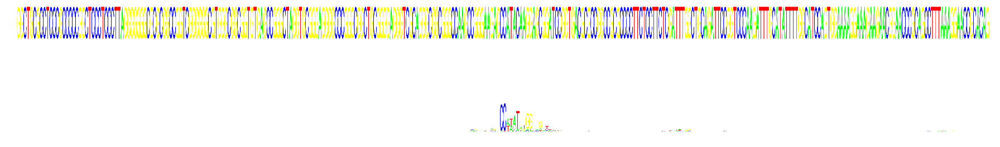

In [127]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 3)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]

height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    


# SP1

In [155]:
len(class_index)

3855

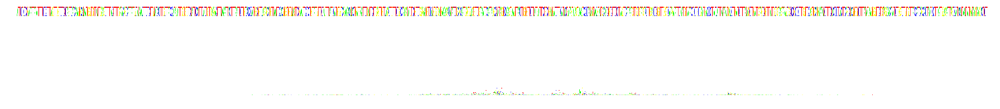

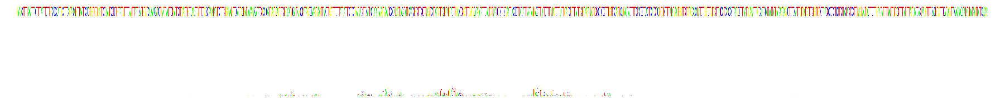

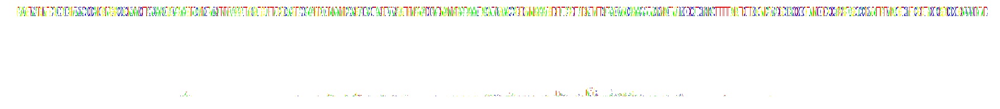

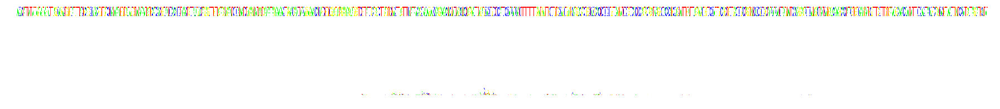

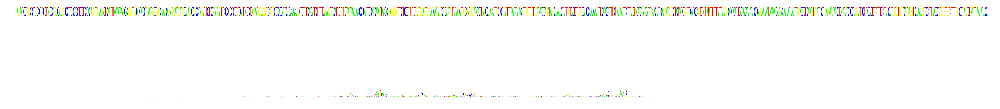

...

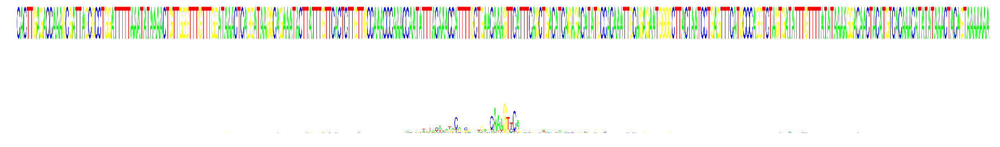

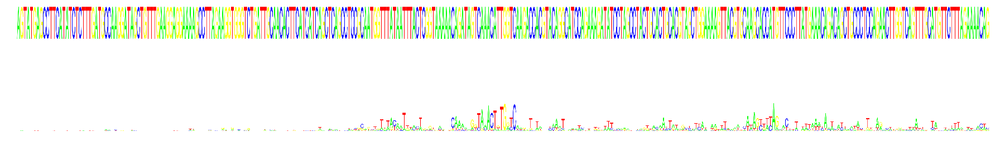

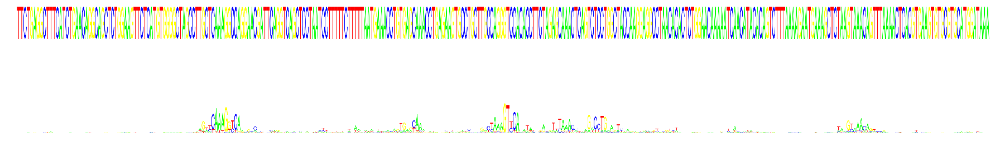

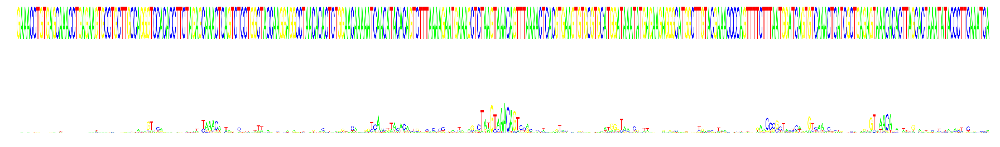

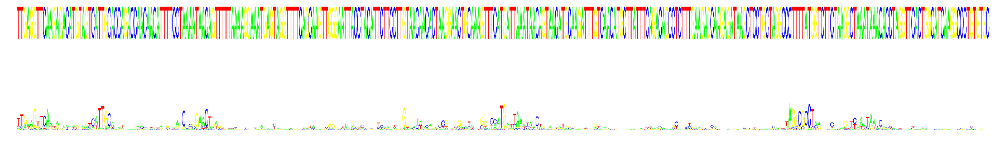

In [156]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

#class_index = np.where(predicted_class == 2)[0]
#ground_truth = np.argmax(valid[1],axis=1)
#index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
#class_index = class_index[index]

unique_index = np.where((valid[1][:,2]==1) & (np.sum(valid[1],axis=1)==1))[0]
class_index = unique_index[np.where(predicted_class[unique_index]==2)[0]]

height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[100:110]:
    
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)
    
    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[100:110]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');
    

# YY1

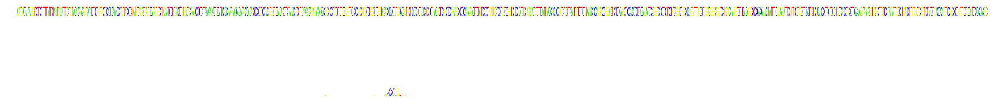

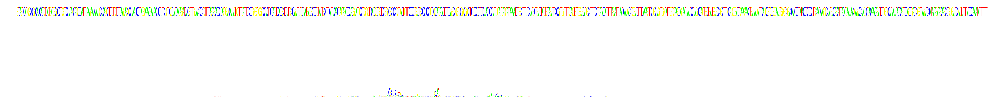

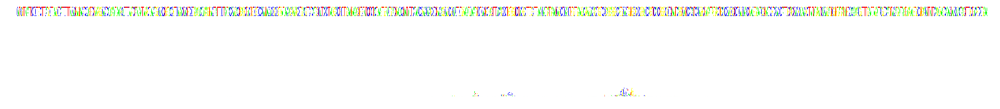

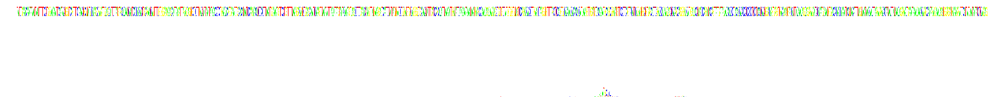

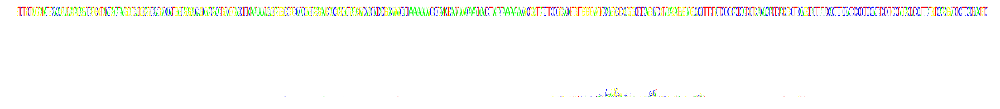

...

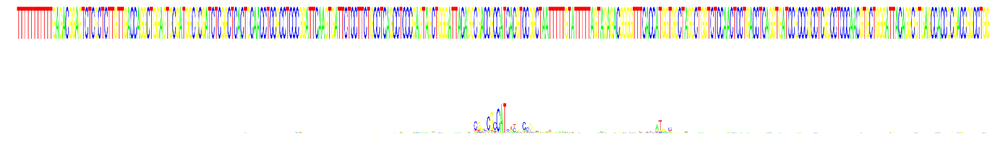

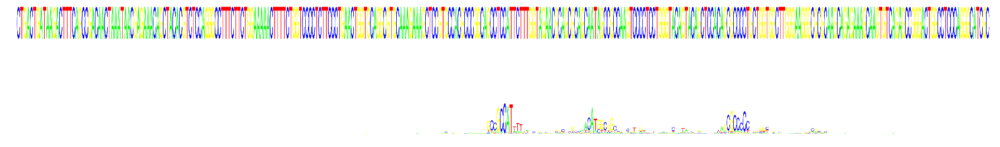

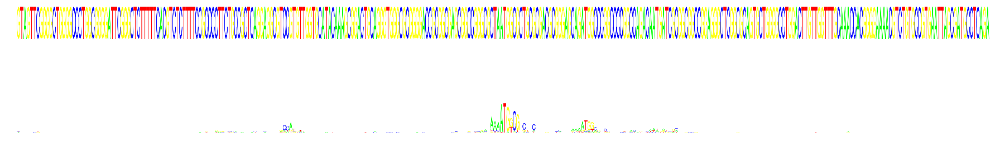

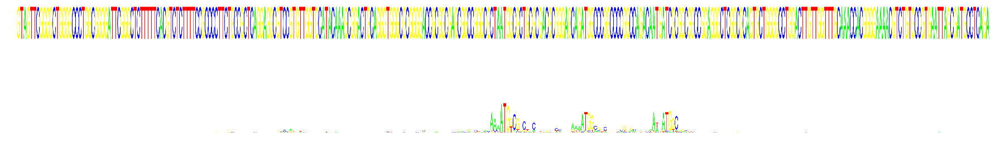

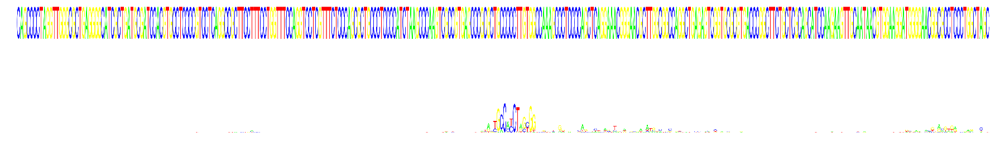

In [123]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 5)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]


height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[30:40]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


# GABP

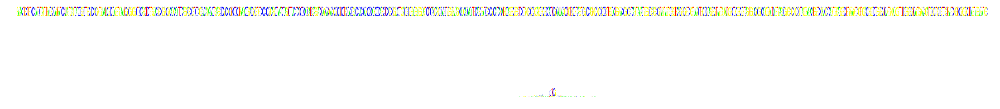

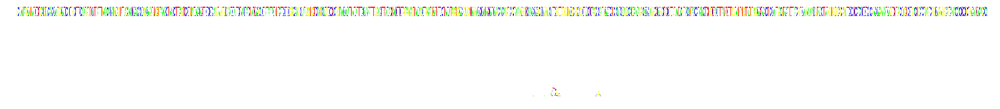

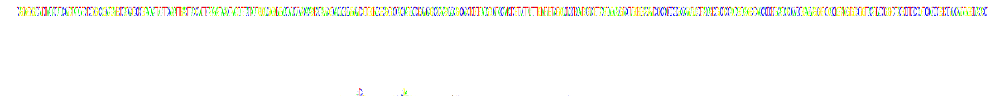

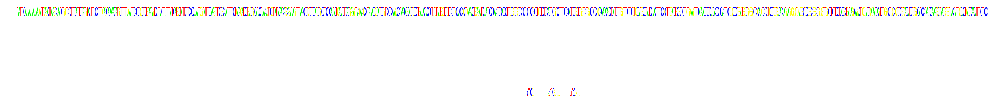

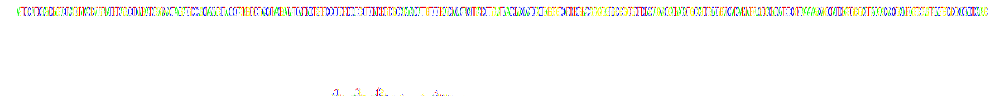

...

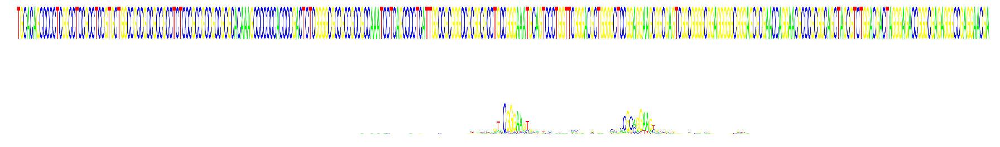

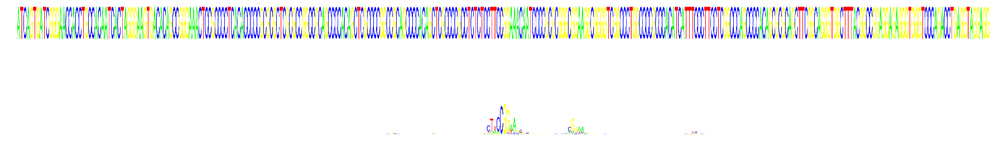

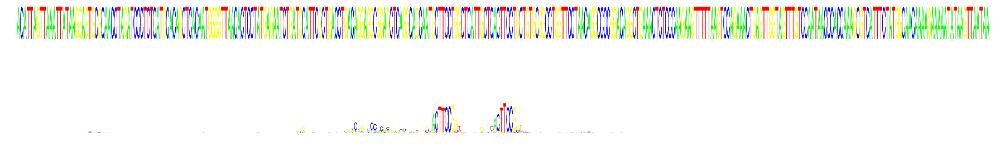

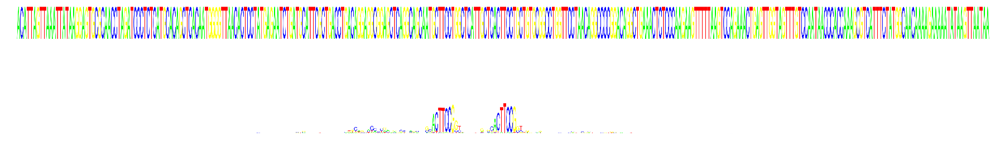

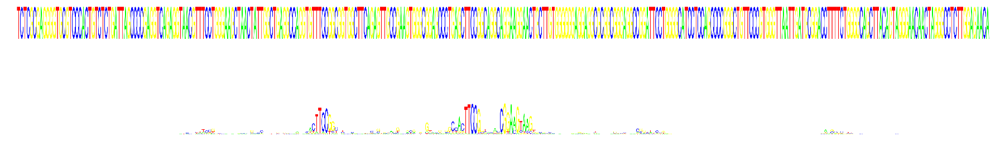

In [124]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 1)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]


height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[30:40]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


# TAF1

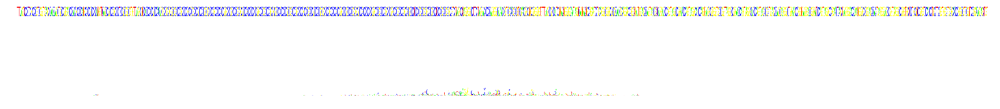

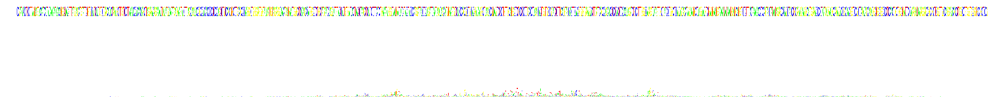

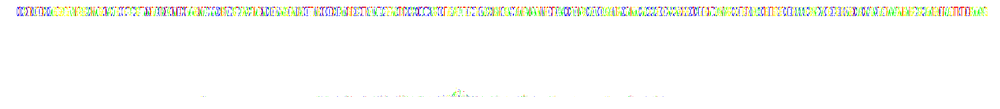

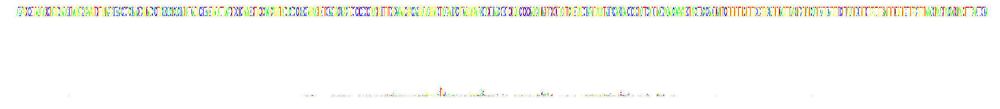

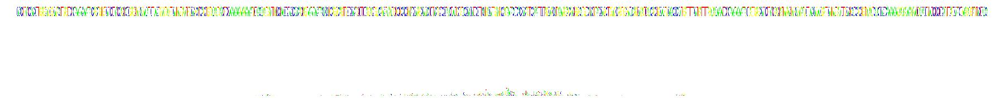

...

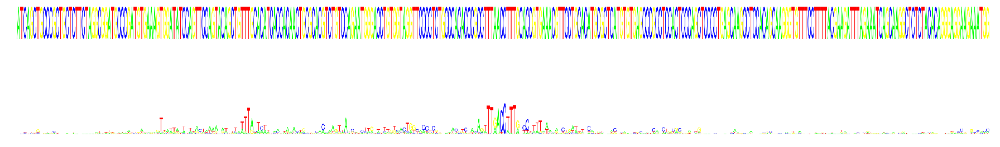

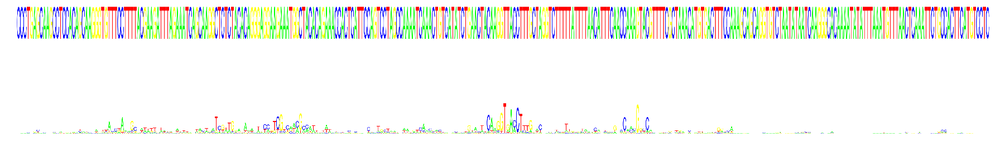

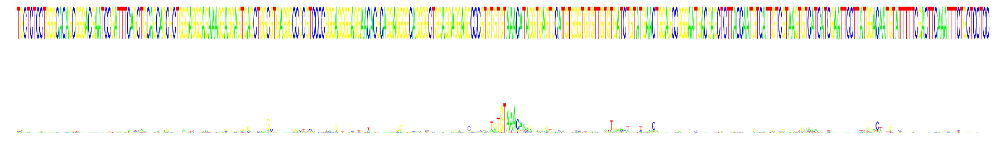

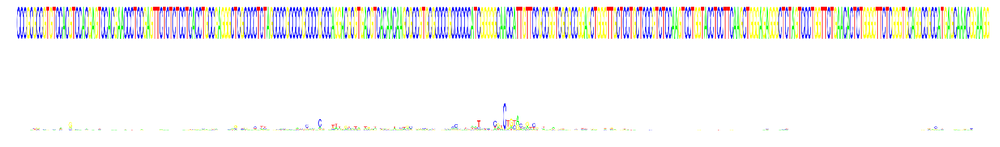

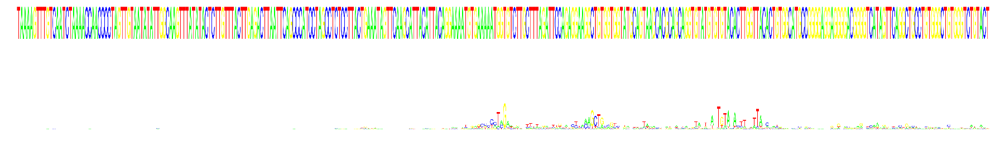

In [152]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)
unique_index = np.where((valid[1][:,4]==1) & (np.sum(valid[1],axis=1)==1))[0]
class_index = unique_index[np.where(predicted_class[unique_index]==2)[0]]

height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[0:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-30,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[10:20]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


# K562 cell-type


# CTCF

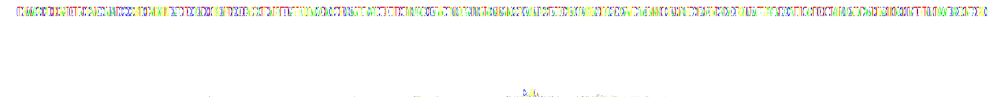

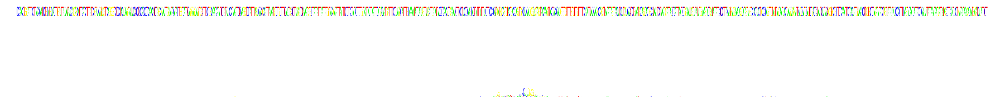

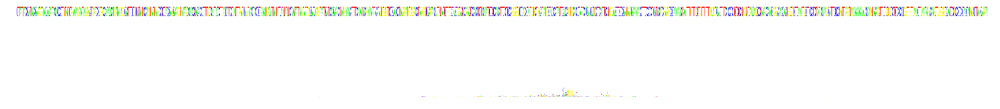

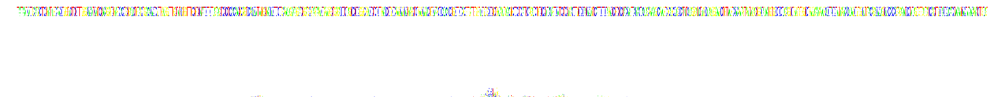

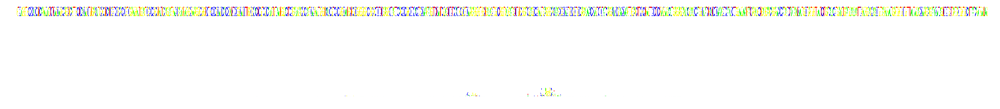

...

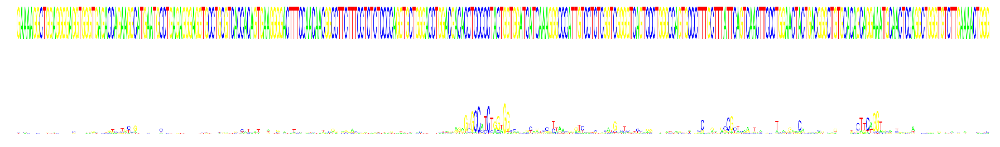

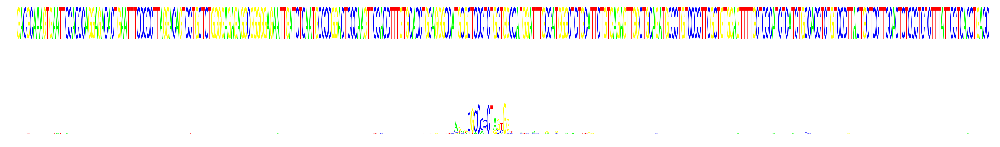

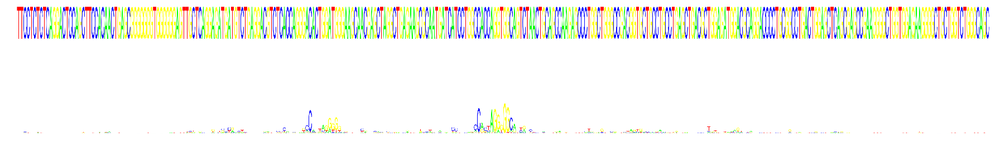

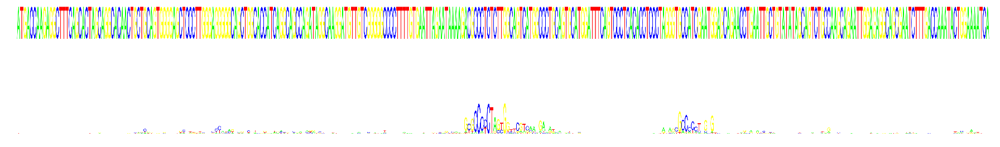

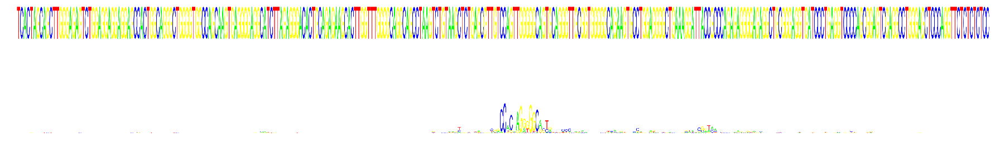

In [93]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(test[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 0)[0]
ground_truth = np.argmax(test[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]


height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = test[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[10:20]:
    X = test[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


# SRF

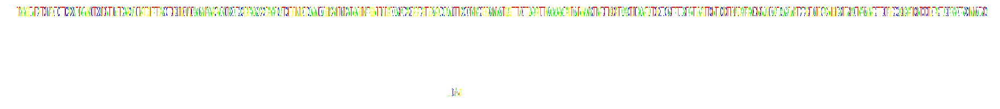

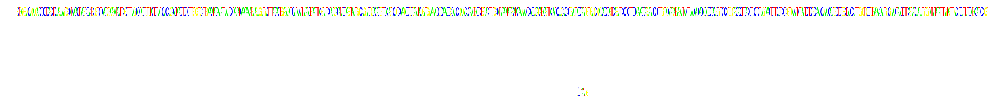

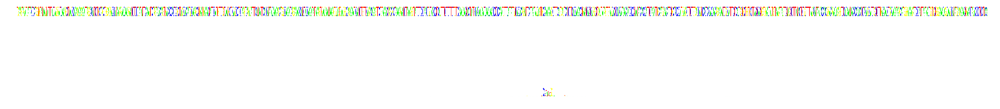

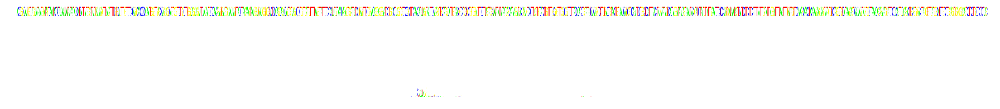

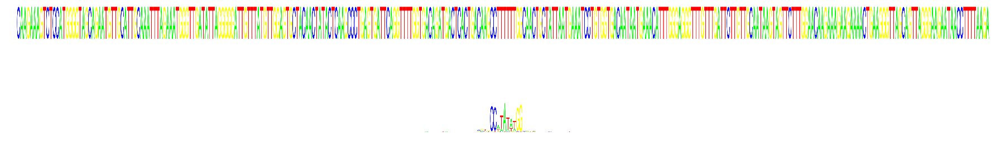

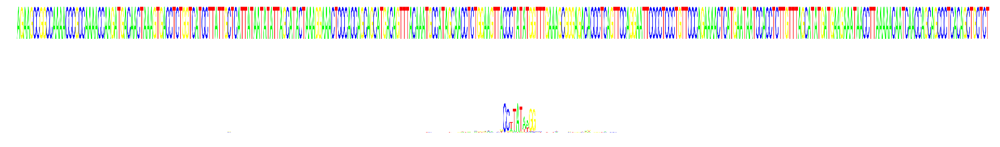

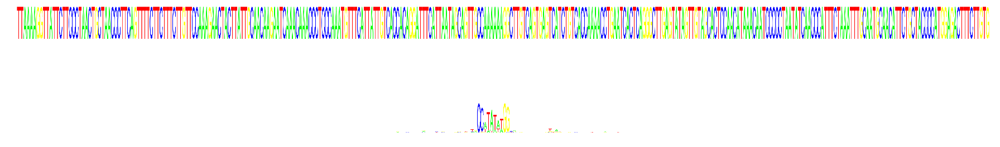

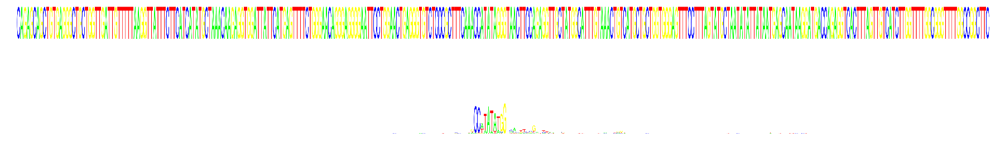

In [97]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(test[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 3)[0]
ground_truth = np.argmax(test[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]

height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = test[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = test[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    


# SP1

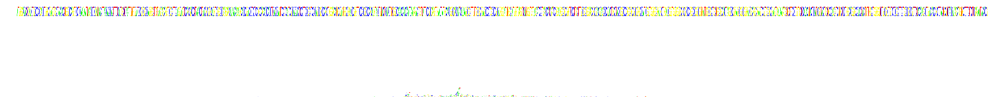

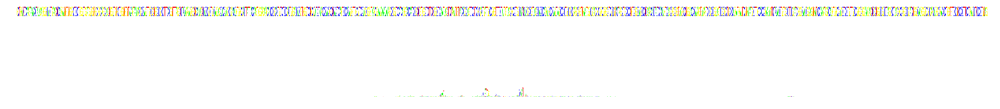

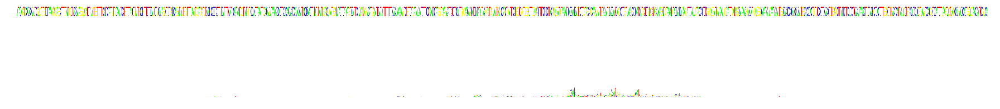

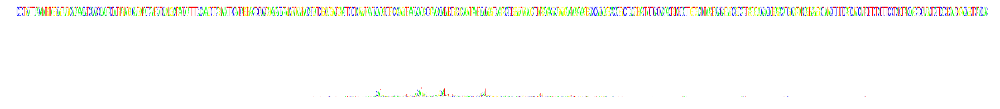

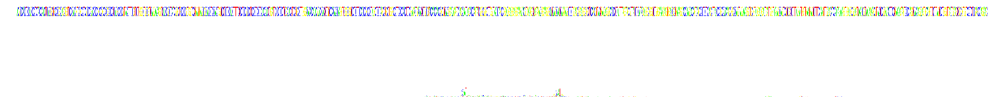

...

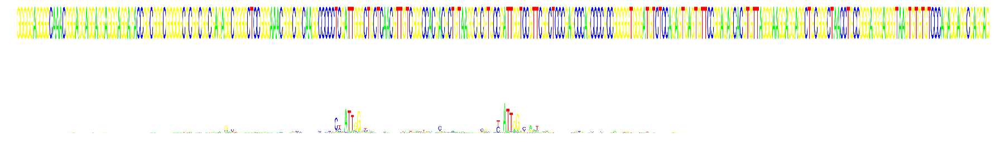

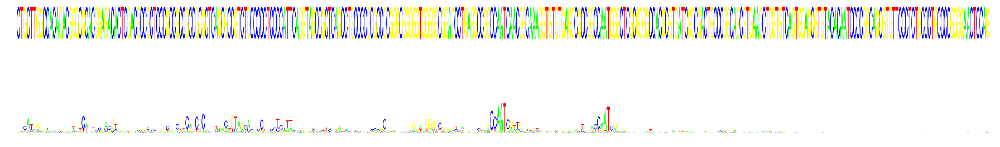

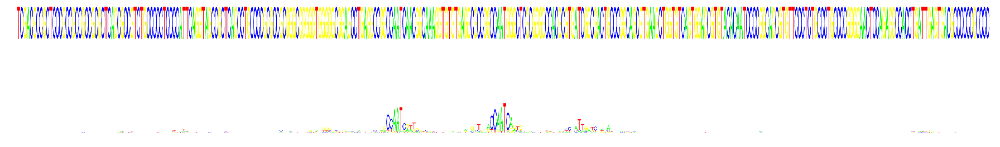

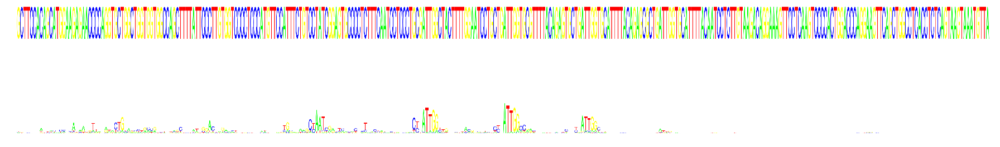

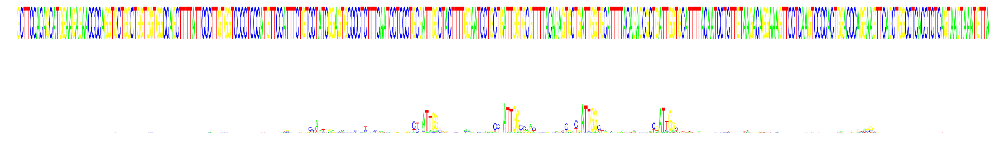

In [95]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 2)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]

height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[10:20]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');
    

# YY1

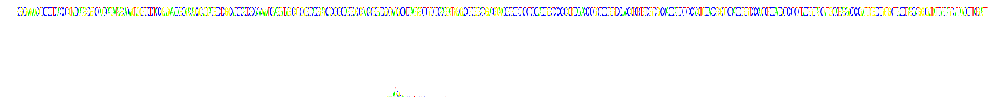

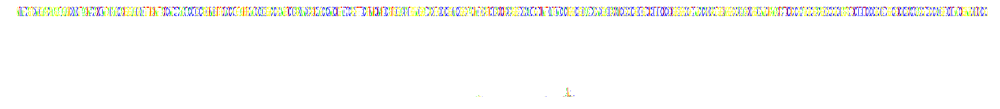

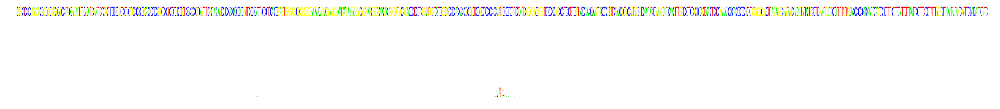

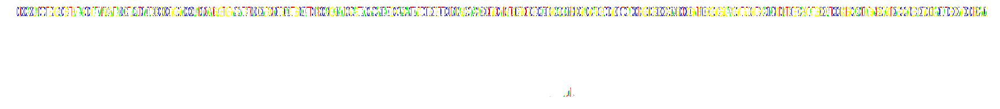

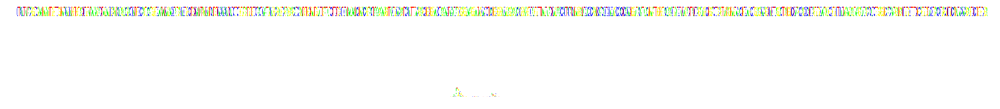

...

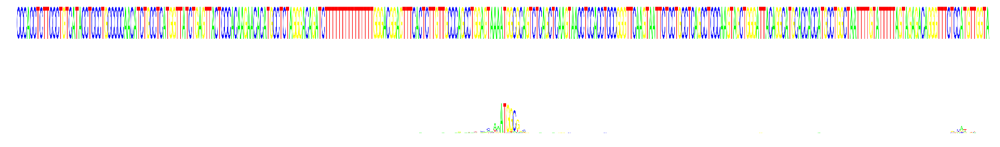

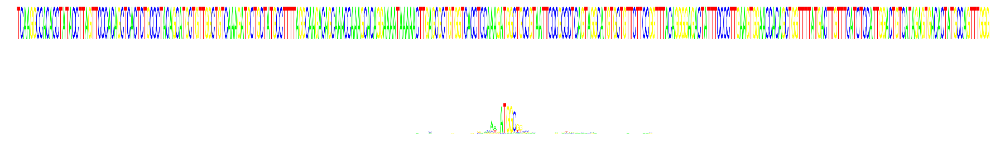

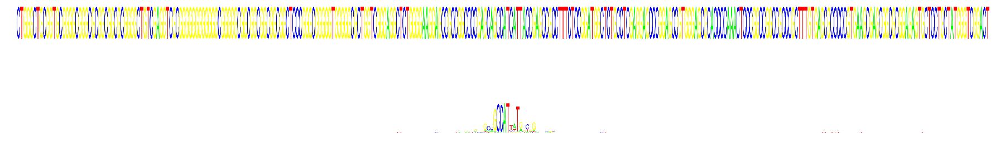

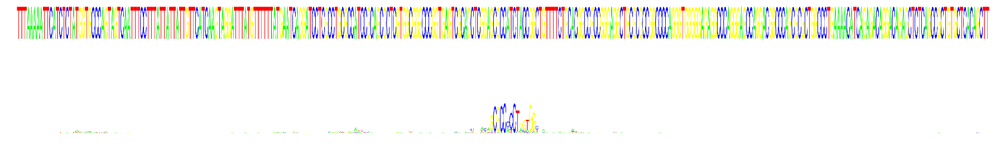

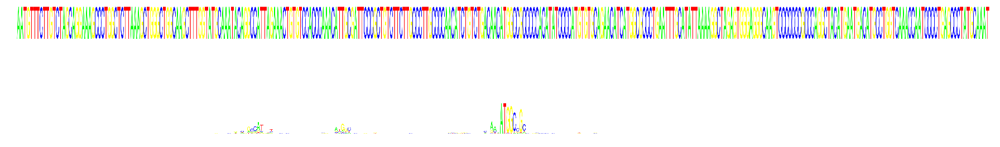

In [103]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 5)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]


height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[30:40]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


# GABP

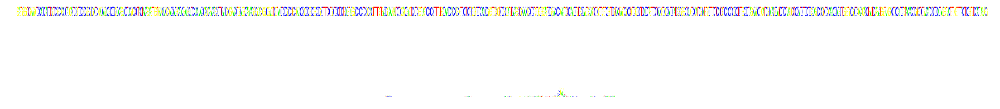

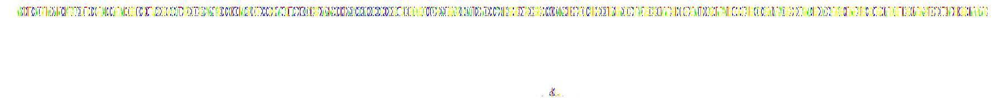

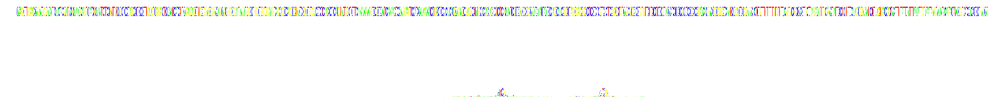

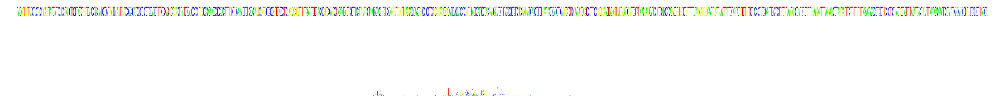

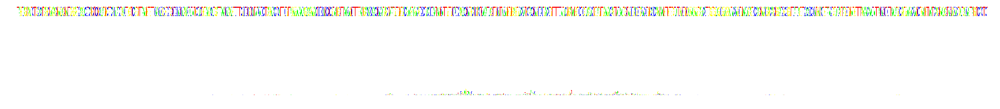

...

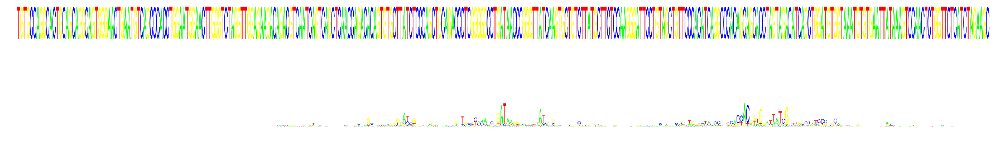

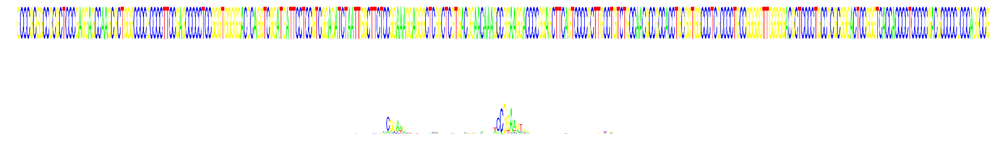

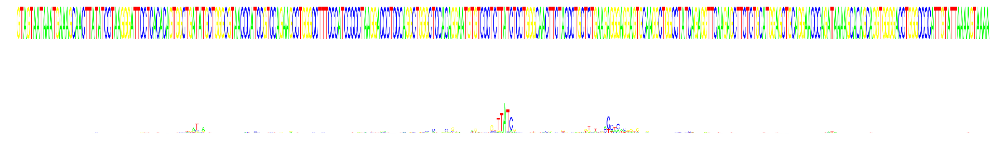

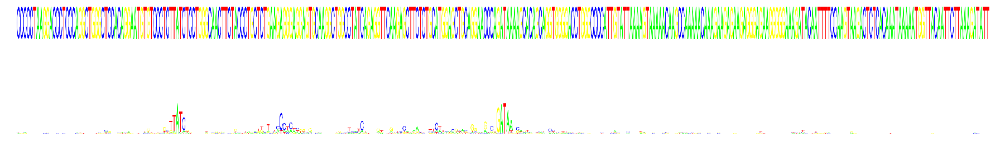

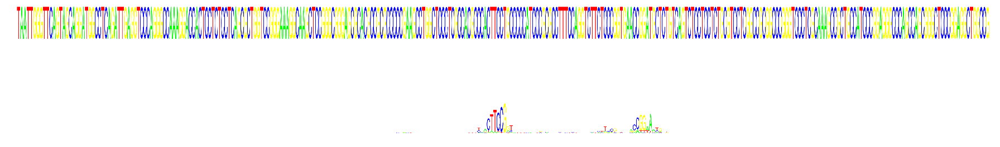

In [98]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 1)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]


height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[:10]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    
    
height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[30:40]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');


# TAF1

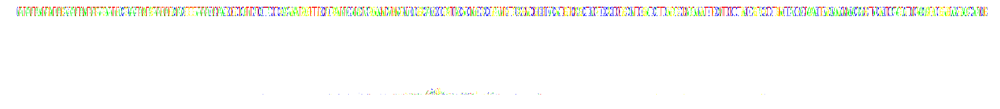

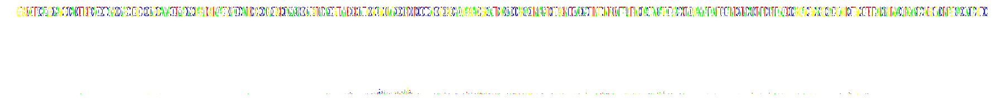

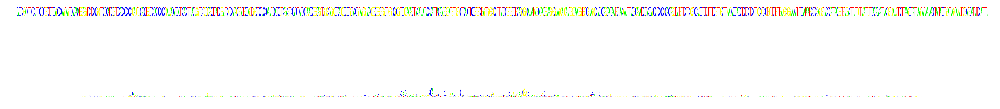

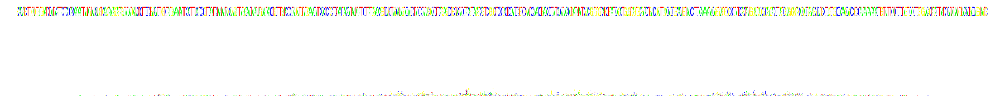

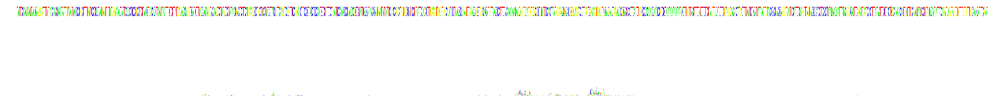

...

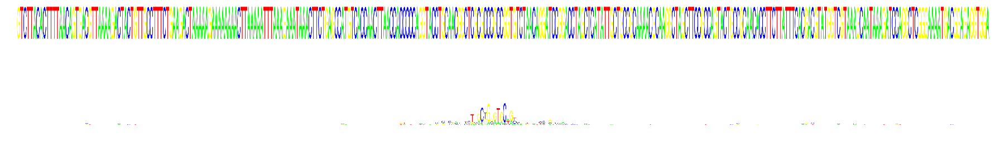

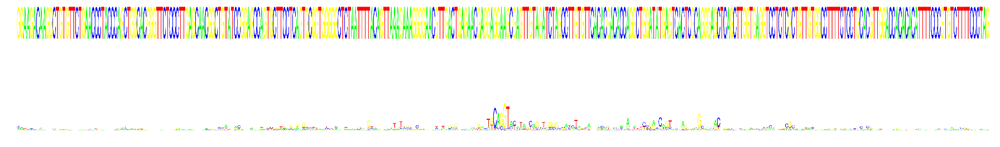

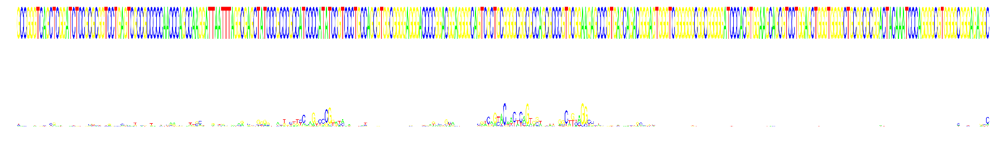

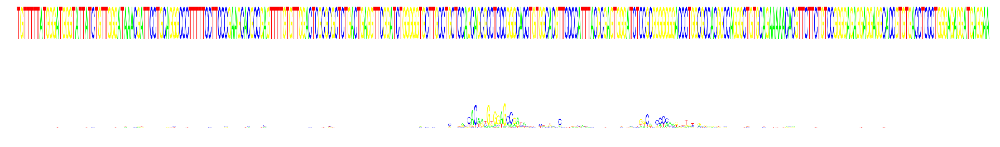

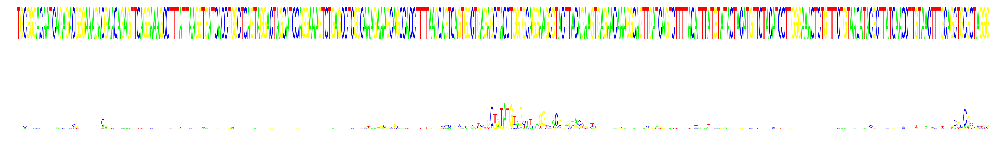

In [104]:

def normalize_pwm(pwm):
    pwm = pwm/np.max(np.abs(pwm))
    pwm += .25
    pwm[pwm<0] = 0
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm    
    return pwm

def normalize_pwm2(pwm):
    MAX = np.max(pwm)
    pwm = pwm/MAX*4
    pwm = np.exp(pwm)
    norm = np.outer(np.ones(4), np.sum(pwm, axis=0))
    pwm = pwm/norm
    return pwm

get_prediction = theano.function([nnmodel.input_var], layers.get_output(net['conv5_active'], deterministic=True), allow_input_downcast=True)
prediction = np.squeeze(get_prediction(valid[0]))
predicted_class = np.argmax(prediction,axis=1)

class_index = np.where(predicted_class == 4)[0]
ground_truth = np.argmax(valid[1],axis=1)
index = np.where(predicted_class[class_index] == ground_truth[class_index])[0]
class_index = class_index[index]

height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[30:40]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-30,index+150)
    index = range(1000)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

height=100
bp_width=20
size = (25.,10.0)
for map_index in class_index[40:50]:
    X = valid[0][map_index]
    X = np.expand_dims(X,0).astype(np.float32)

    saliency, max_class = saliency_fn(X)
    pwm2 = np.copy(np.squeeze(saliency[0]))
    pwm2=normalize_pwm2(pwm2)
    index = np.argmax(np.std(pwm2,axis=0))
    index = range(index-150,index+150)
    pwm2 = pwm2[:,index]
    
    
    logo = seq_logo(np.squeeze(X[0])[:,index], height, bp_width, norm=0, rna=0, filepath='.')
    fig = plt.figure(figsize=size);
    plt.subplot(2,1,1)
    plt.imshow(logo, interpolation='none');
    plt.axis('off');

    plt.subplot(2,1,2)
    logo = seq_logo(pwm2, height, bp_width, norm=0, rna=0, filepath='.')
    plt.imshow(logo, interpolation='none');
    plt.axis('off');
